- [參考1](https://www.itdaan.com/tw/aa51f1ecf4217d0aaf8ded08e9ae5258)
- [參考2](https://github.com/Arnav0400/CS231n-2019/blob/master/assignment3/Generative_Adversarial_Networks_TF.ipynb)

# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [ ]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

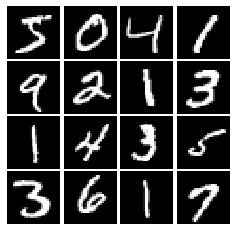

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [9]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size,dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [10]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [11]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [12]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [13]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [14]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [17]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [18]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [19]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [20]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [21]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.021, G:0.7523
Instructions for updating:
Use tf.identity instead.


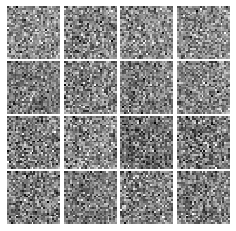

Epoch: 0, Iter: 20, D: 0.582, G:0.932


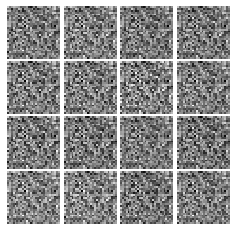

Epoch: 0, Iter: 40, D: 0.5347, G:1.121


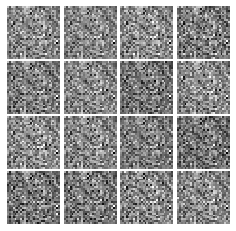

Epoch: 0, Iter: 60, D: 1.541, G:0.9193


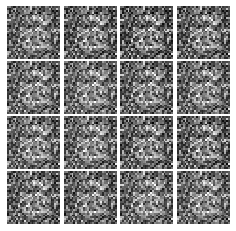

Epoch: 0, Iter: 80, D: 1.173, G:1.381


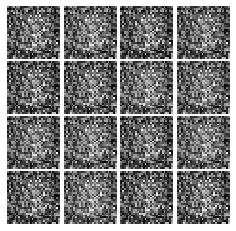

Epoch: 0, Iter: 100, D: 1.262, G:0.9156


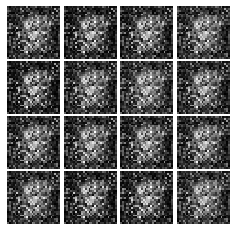

Epoch: 0, Iter: 120, D: 1.492, G:2.156


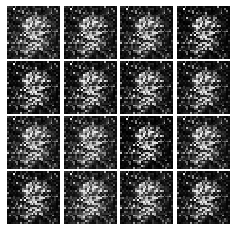

Epoch: 0, Iter: 140, D: 1.69, G:0.7513


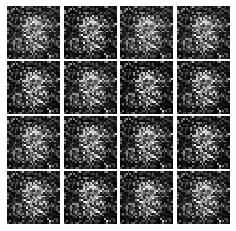

Epoch: 0, Iter: 160, D: 0.9413, G:1.616


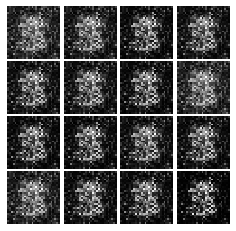

Epoch: 0, Iter: 180, D: 0.973, G:1.321


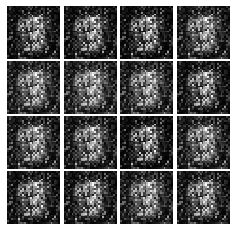

Epoch: 0, Iter: 200, D: 1.489, G:0.9761


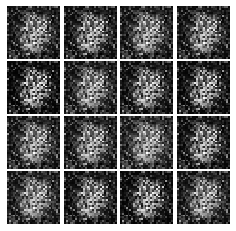

Epoch: 0, Iter: 220, D: 1.474, G:0.6167


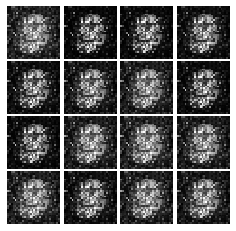

Epoch: 0, Iter: 240, D: 1.105, G:1.416


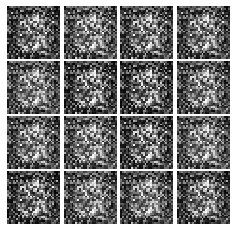

Epoch: 0, Iter: 260, D: 1.617, G:1.324


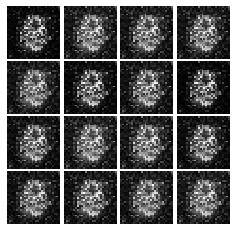

Epoch: 0, Iter: 280, D: 1.718, G:1.377


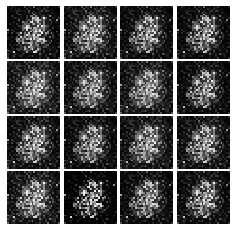

Epoch: 0, Iter: 300, D: 1.003, G:1.422


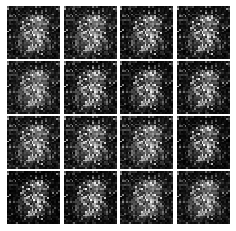

Epoch: 0, Iter: 320, D: 1.528, G:1.748


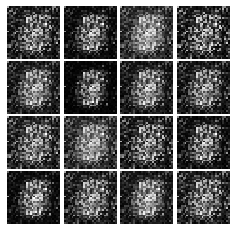

Epoch: 0, Iter: 340, D: 1.157, G:1.234


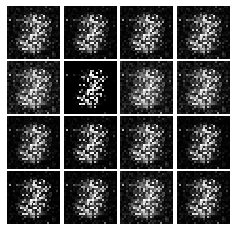

Epoch: 0, Iter: 360, D: 0.8899, G:1.729


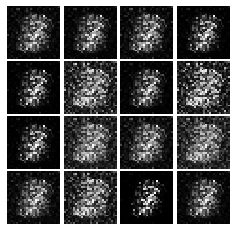

Epoch: 0, Iter: 380, D: 1.197, G:1.45


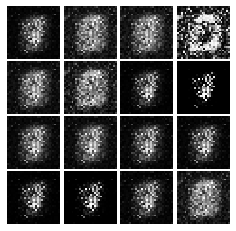

Epoch: 0, Iter: 400, D: 1.21, G:1.344


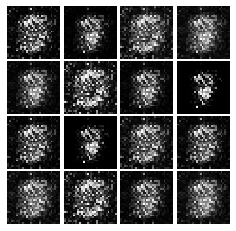

Epoch: 0, Iter: 420, D: 1.011, G:1.337


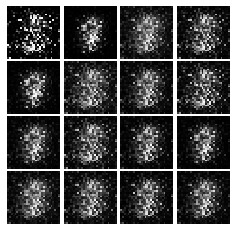

Epoch: 0, Iter: 440, D: 1.188, G:1.25


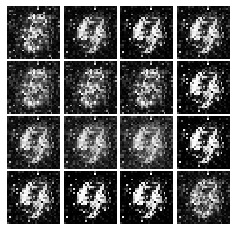

Epoch: 0, Iter: 460, D: 1.171, G:1.211


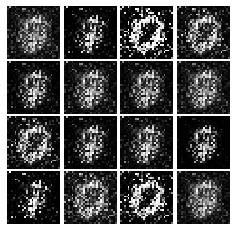

Epoch: 1, Iter: 480, D: 1.689, G:1.043


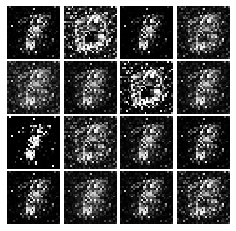

Epoch: 1, Iter: 500, D: 0.9429, G:1.651


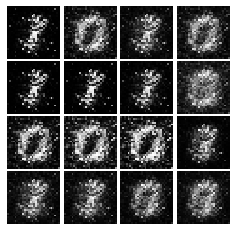

Epoch: 1, Iter: 520, D: 1.018, G:1.282


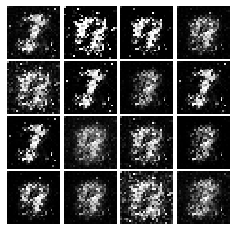

Epoch: 1, Iter: 540, D: 1.098, G:1.032


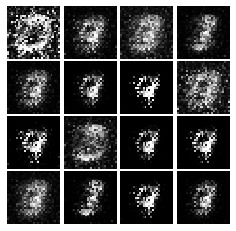

Epoch: 1, Iter: 560, D: 1.238, G:1.169


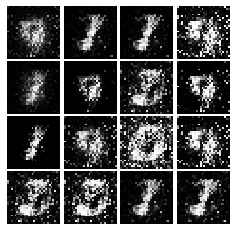

Epoch: 1, Iter: 580, D: 1.311, G:1.031


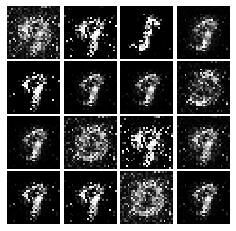

Epoch: 1, Iter: 600, D: 1.015, G:0.9843


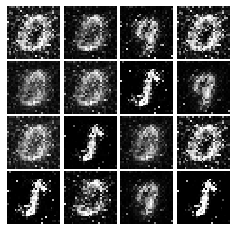

Epoch: 1, Iter: 620, D: 0.8618, G:1.662


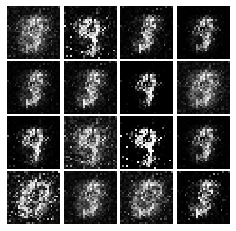

Epoch: 1, Iter: 640, D: 0.9132, G:2.766


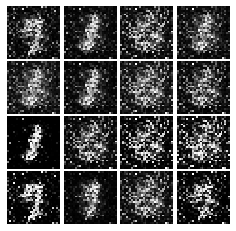

Epoch: 1, Iter: 660, D: 1.089, G:1.021


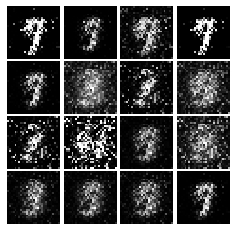

Epoch: 1, Iter: 680, D: 0.9222, G:1.389


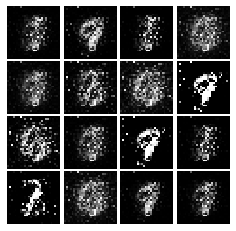

Epoch: 1, Iter: 700, D: 1.233, G:1.726


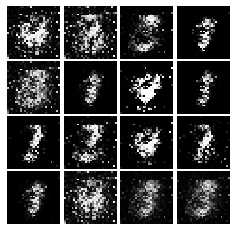

Epoch: 1, Iter: 720, D: 1.065, G:1.328


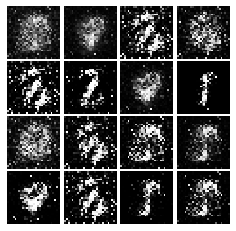

Epoch: 1, Iter: 740, D: 1.022, G:1.432


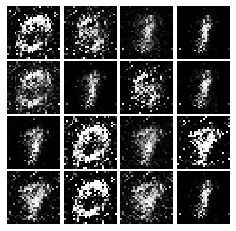

Epoch: 1, Iter: 760, D: 1.009, G:1.204


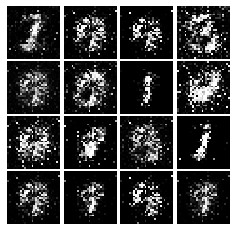

Epoch: 1, Iter: 780, D: 1.075, G:2.762


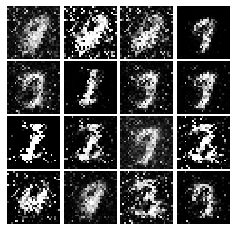

Epoch: 1, Iter: 800, D: 1.146, G:0.8955


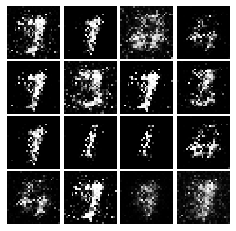

Epoch: 1, Iter: 820, D: 1.236, G:1.157


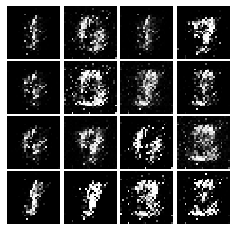

Epoch: 1, Iter: 840, D: 1.281, G:1.039


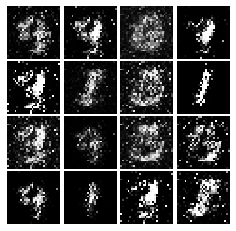

Epoch: 1, Iter: 860, D: 1.076, G:1.151


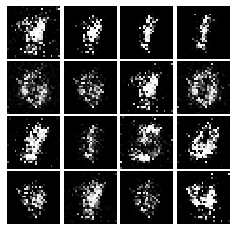

Epoch: 1, Iter: 880, D: 1.37, G:2.245


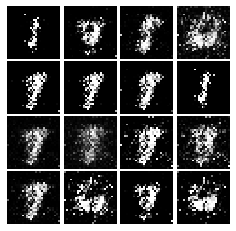

Epoch: 1, Iter: 900, D: 0.9025, G:2.211


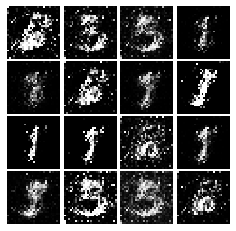

Epoch: 1, Iter: 920, D: 1.154, G:0.9644


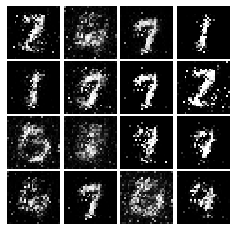

Epoch: 2, Iter: 940, D: 1.154, G:1.153


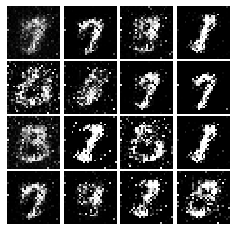

Epoch: 2, Iter: 960, D: 1.14, G:1.249


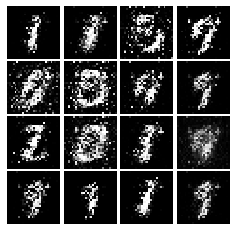

Epoch: 2, Iter: 980, D: 1.087, G:1.306


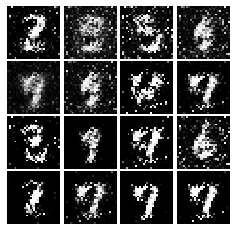

Epoch: 2, Iter: 1000, D: 1.076, G:1.78


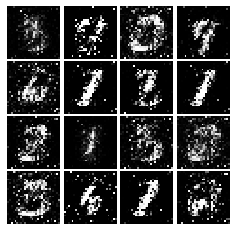

Epoch: 2, Iter: 1020, D: 1.214, G:1.482


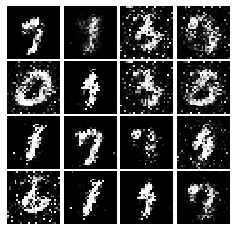

Epoch: 2, Iter: 1040, D: 1.139, G:1.437


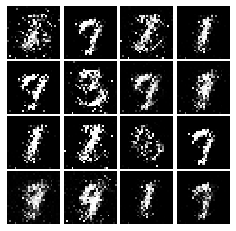

Epoch: 2, Iter: 1060, D: 1.143, G:1.41


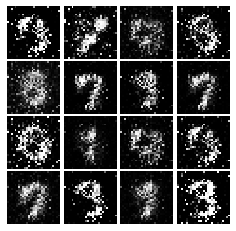

Epoch: 2, Iter: 1080, D: 1.393, G:1.018


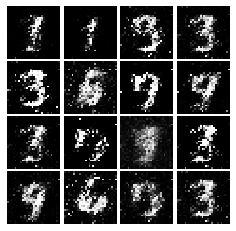

Epoch: 2, Iter: 1100, D: 1.092, G:1.118


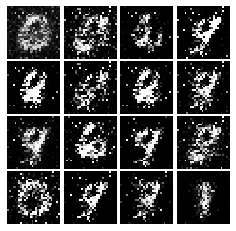

Epoch: 2, Iter: 1120, D: 1.164, G:1.054


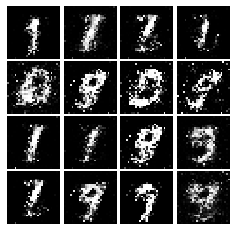

Epoch: 2, Iter: 1140, D: 1.318, G:0.7675


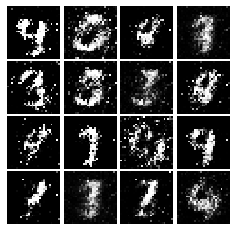

Epoch: 2, Iter: 1160, D: 1.138, G:1.036


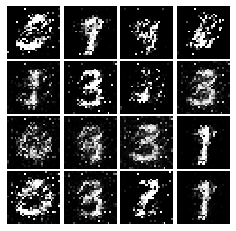

Epoch: 2, Iter: 1180, D: 1.356, G:0.8146


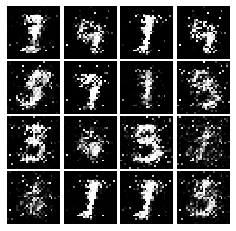

Epoch: 2, Iter: 1200, D: 1.562, G:0.9125


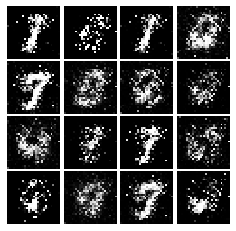

Epoch: 2, Iter: 1220, D: 1.538, G:0.8981


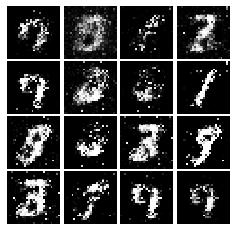

Epoch: 2, Iter: 1240, D: 1.122, G:1.079


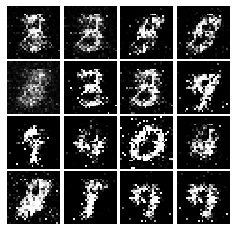

Epoch: 2, Iter: 1260, D: 1.415, G:1.274


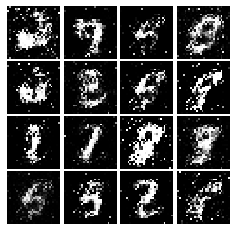

Epoch: 2, Iter: 1280, D: 1.2, G:1.044


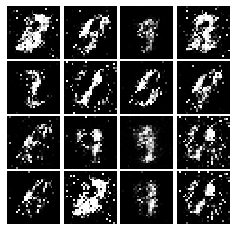

Epoch: 2, Iter: 1300, D: 1.26, G:1.027


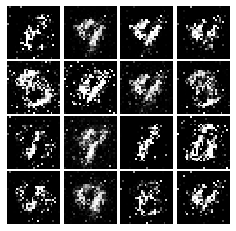

Epoch: 2, Iter: 1320, D: 1.362, G:0.8719


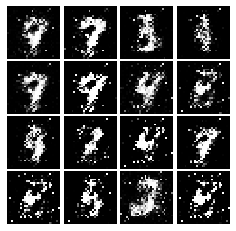

Epoch: 2, Iter: 1340, D: 1.121, G:1.159


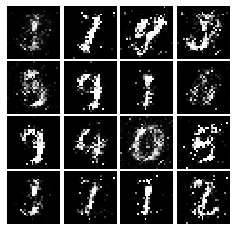

Epoch: 2, Iter: 1360, D: 1.244, G:1.099


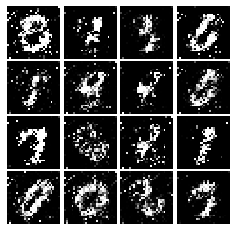

Epoch: 2, Iter: 1380, D: 1.167, G:1.44


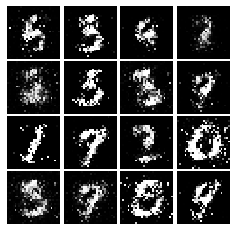

Epoch: 2, Iter: 1400, D: 1.321, G:0.8815


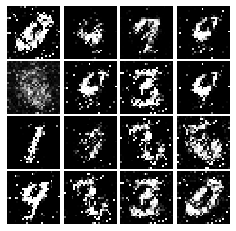

Epoch: 3, Iter: 1420, D: 1.233, G:0.771


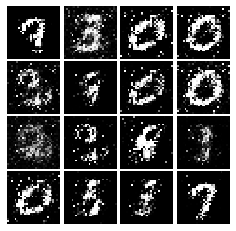

Epoch: 3, Iter: 1440, D: 1.107, G:1.402


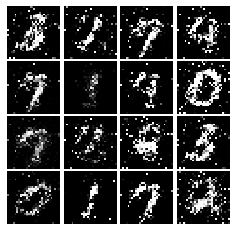

Epoch: 3, Iter: 1460, D: 1.133, G:1.21


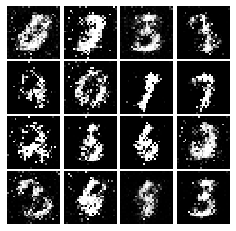

Epoch: 3, Iter: 1480, D: 1.11, G:1.098


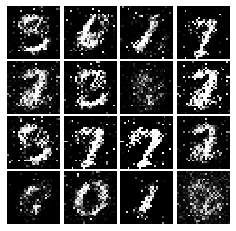

Epoch: 3, Iter: 1500, D: 1.288, G:1.281


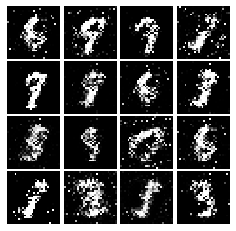

Epoch: 3, Iter: 1520, D: 1.26, G:1.111


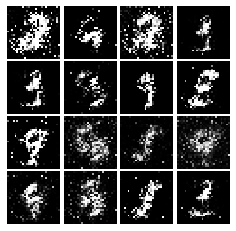

Epoch: 3, Iter: 1540, D: 1.252, G:1.022


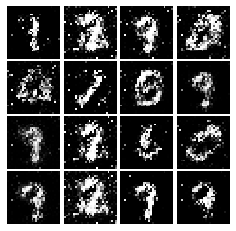

Epoch: 3, Iter: 1560, D: 1.122, G:1.052


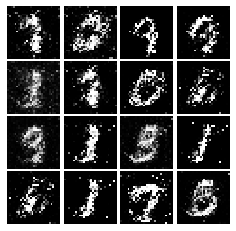

Epoch: 3, Iter: 1580, D: 1.359, G:0.9872


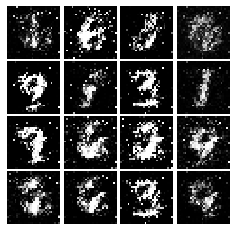

Epoch: 3, Iter: 1600, D: 1.159, G:1.047


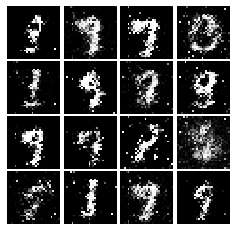

Epoch: 3, Iter: 1620, D: 1.248, G:0.9758


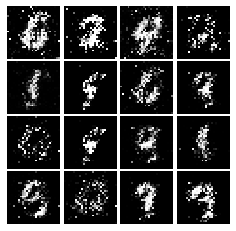

Epoch: 3, Iter: 1640, D: 1.323, G:1.325


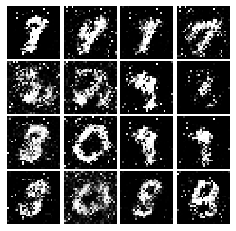

Epoch: 3, Iter: 1660, D: 1.124, G:1.056


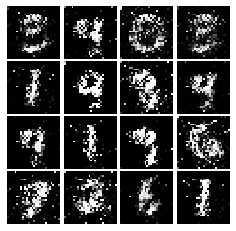

Epoch: 3, Iter: 1680, D: 1.343, G:0.5962


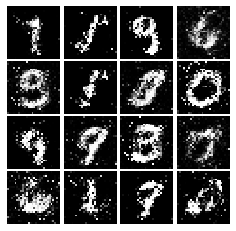

Epoch: 3, Iter: 1700, D: 1.389, G:0.9346


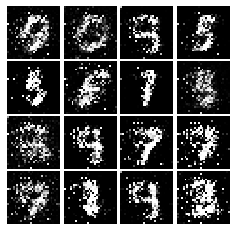

Epoch: 3, Iter: 1720, D: 1.19, G:1.139


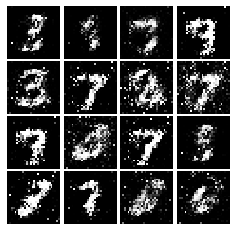

Epoch: 3, Iter: 1740, D: 1.105, G:0.7546


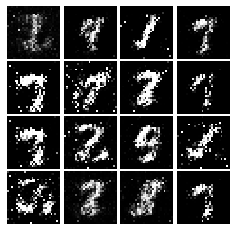

Epoch: 3, Iter: 1760, D: 1.2, G:1.051


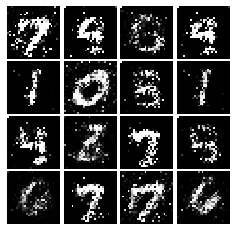

Epoch: 3, Iter: 1780, D: 1.267, G:1.035


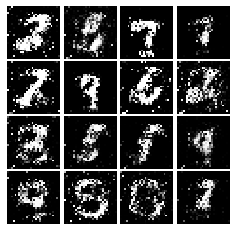

Epoch: 3, Iter: 1800, D: 1.215, G:0.8035


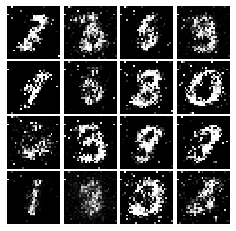

Epoch: 3, Iter: 1820, D: 1.337, G:0.9045


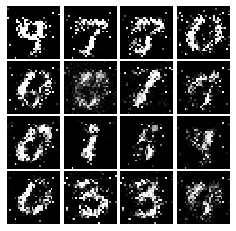

Epoch: 3, Iter: 1840, D: 1.358, G:1.021


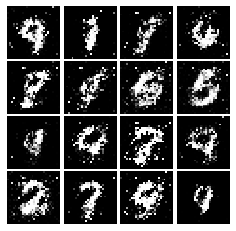

Epoch: 3, Iter: 1860, D: 1.315, G:0.8406


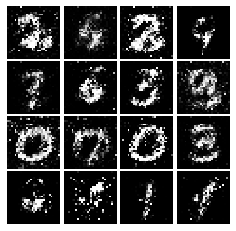

Epoch: 4, Iter: 1880, D: 1.305, G:0.8239


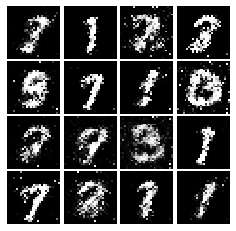

Epoch: 4, Iter: 1900, D: 1.349, G:0.8557


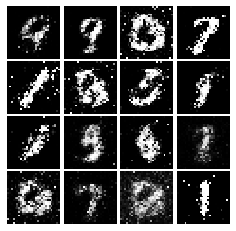

Epoch: 4, Iter: 1920, D: 1.27, G:0.9896


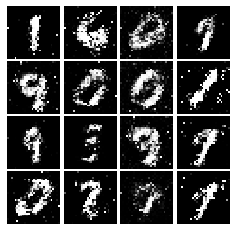

Epoch: 4, Iter: 1940, D: 1.227, G:0.9075


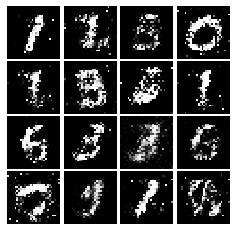

Epoch: 4, Iter: 1960, D: 1.293, G:0.8454


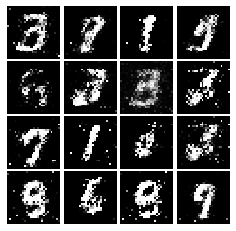

Epoch: 4, Iter: 1980, D: 1.331, G:0.8369


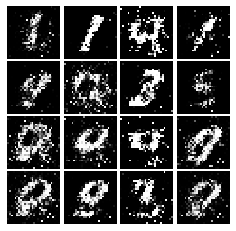

Epoch: 4, Iter: 2000, D: 1.295, G:0.7939


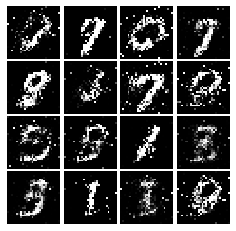

Epoch: 4, Iter: 2020, D: 1.285, G:0.8471


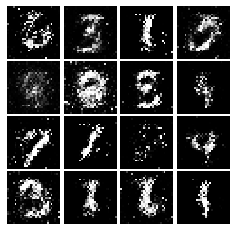

Epoch: 4, Iter: 2040, D: 1.24, G:0.8173


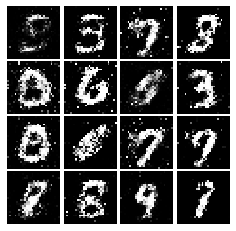

Epoch: 4, Iter: 2060, D: 1.381, G:1.004


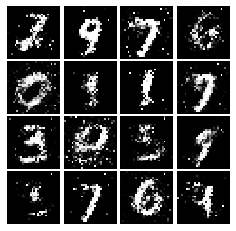

Epoch: 4, Iter: 2080, D: 1.388, G:0.8365


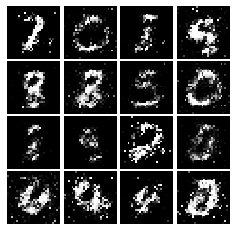

Epoch: 4, Iter: 2100, D: 1.296, G:0.8988


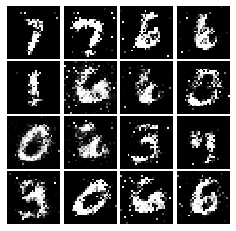

Epoch: 4, Iter: 2120, D: 1.267, G:0.9264


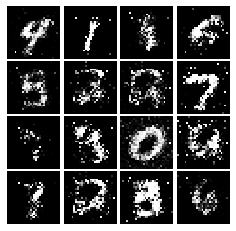

Epoch: 4, Iter: 2140, D: 1.284, G:0.8656


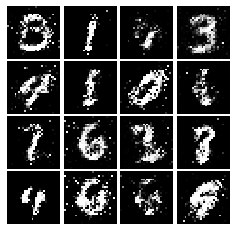

Epoch: 4, Iter: 2160, D: 1.408, G:0.942


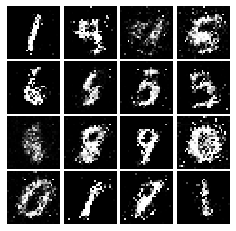

Epoch: 4, Iter: 2180, D: 1.36, G:0.8639


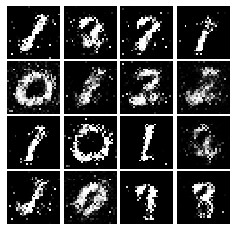

Epoch: 4, Iter: 2200, D: 1.305, G:0.8927


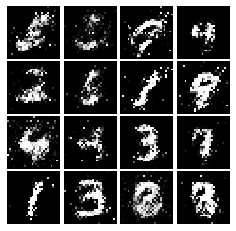

Epoch: 4, Iter: 2220, D: 1.301, G:0.8641


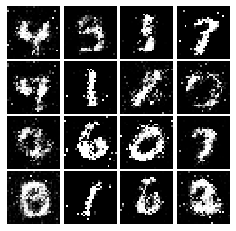

Epoch: 4, Iter: 2240, D: 1.237, G:0.8068


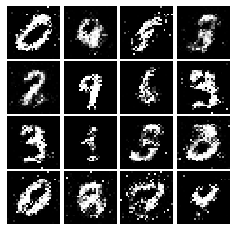

Epoch: 4, Iter: 2260, D: 1.252, G:0.8656


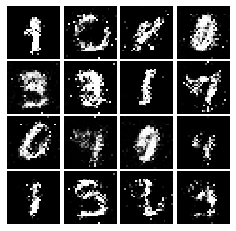

Epoch: 4, Iter: 2280, D: 1.351, G:0.78


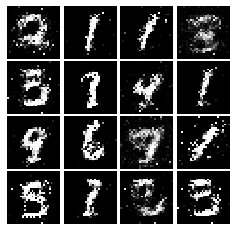

Epoch: 4, Iter: 2300, D: 1.295, G:0.7683


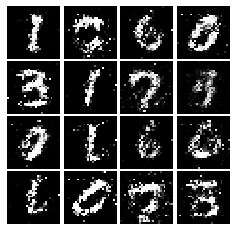

Epoch: 4, Iter: 2320, D: 1.262, G:0.8446


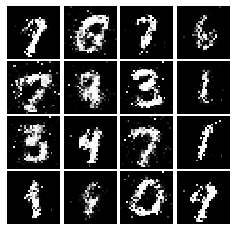

Epoch: 4, Iter: 2340, D: 1.227, G:1.054


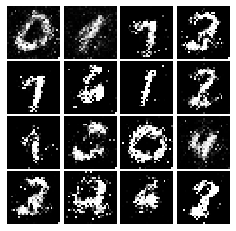

Epoch: 5, Iter: 2360, D: 1.209, G:0.8852


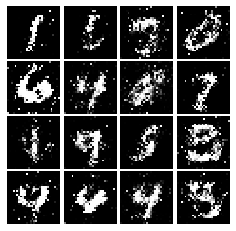

Epoch: 5, Iter: 2380, D: 1.318, G:0.8163


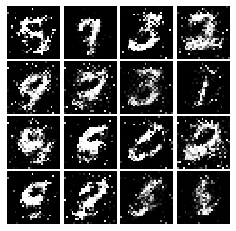

Epoch: 5, Iter: 2400, D: 1.225, G:0.9024


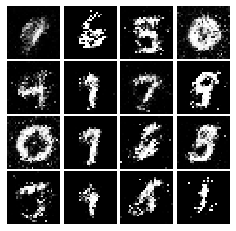

Epoch: 5, Iter: 2420, D: 1.201, G:0.9286


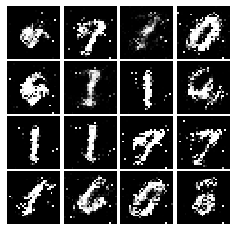

Epoch: 5, Iter: 2440, D: 1.347, G:0.8081


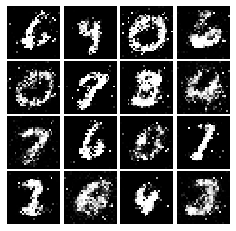

Epoch: 5, Iter: 2460, D: 1.101, G:0.9944


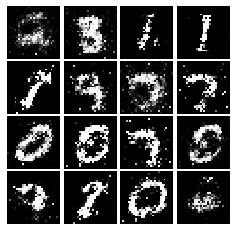

Epoch: 5, Iter: 2480, D: 1.294, G:0.8808


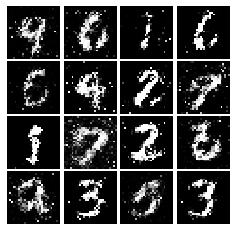

Epoch: 5, Iter: 2500, D: 1.205, G:0.858


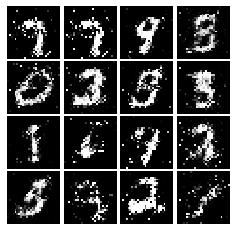

Epoch: 5, Iter: 2520, D: 1.406, G:0.8202


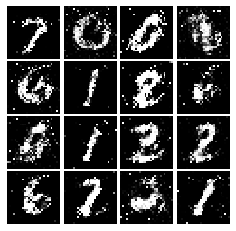

Epoch: 5, Iter: 2540, D: 1.359, G:0.8129


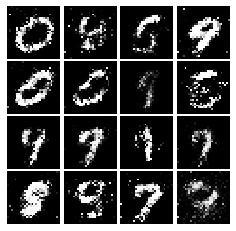

Epoch: 5, Iter: 2560, D: 1.337, G:0.8007


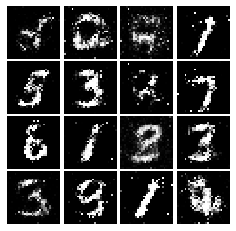

Epoch: 5, Iter: 2580, D: 1.306, G:0.8898


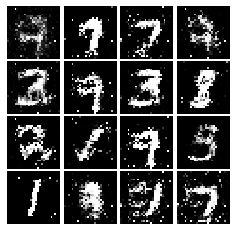

Epoch: 5, Iter: 2600, D: 1.527, G:0.776


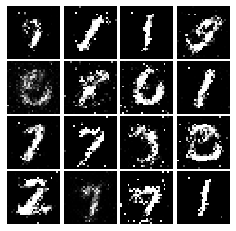

Epoch: 5, Iter: 2620, D: 1.338, G:0.9067


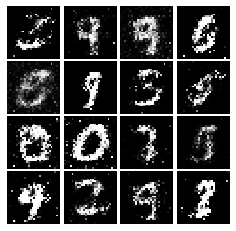

Epoch: 5, Iter: 2640, D: 1.327, G:0.8283


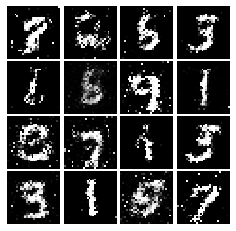

Epoch: 5, Iter: 2660, D: 1.31, G:0.8409


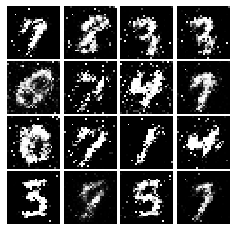

Epoch: 5, Iter: 2680, D: 1.314, G:0.8136


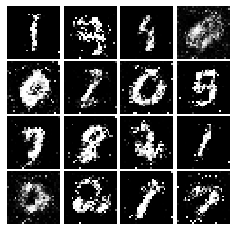

Epoch: 5, Iter: 2700, D: 1.363, G:0.7499


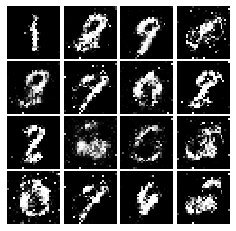

Epoch: 5, Iter: 2720, D: 1.383, G:0.7766


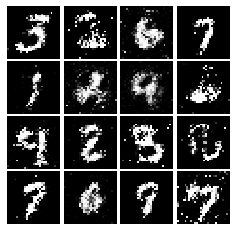

Epoch: 5, Iter: 2740, D: 1.288, G:0.8841


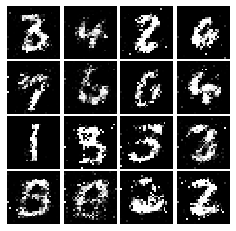

Epoch: 5, Iter: 2760, D: 1.318, G:0.7346


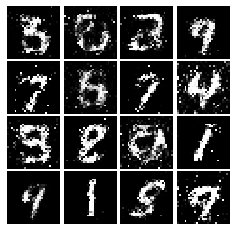

Epoch: 5, Iter: 2780, D: 1.267, G:0.8121


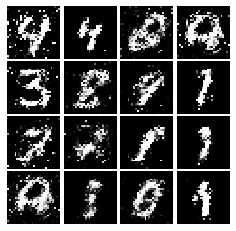

Epoch: 5, Iter: 2800, D: 1.215, G:0.8144


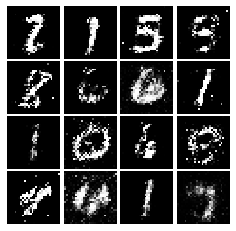

Epoch: 6, Iter: 2820, D: 1.259, G:0.7861


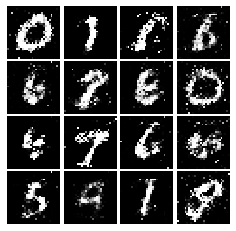

Epoch: 6, Iter: 2840, D: 1.396, G:1.027


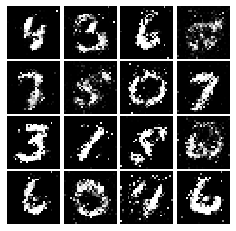

Epoch: 6, Iter: 2860, D: 1.288, G:0.8025


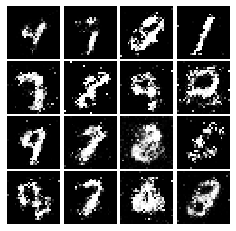

Epoch: 6, Iter: 2880, D: 1.241, G:0.9236


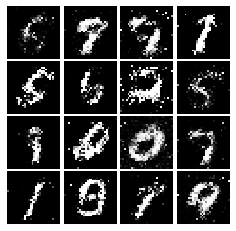

Epoch: 6, Iter: 2900, D: 1.331, G:0.8156


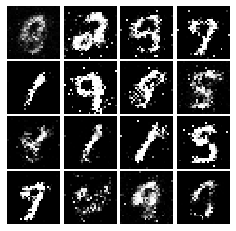

Epoch: 6, Iter: 2920, D: 1.391, G:0.7454


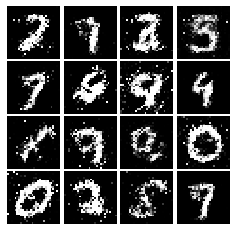

Epoch: 6, Iter: 2940, D: 1.33, G:0.8032


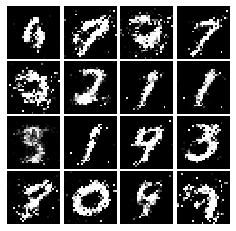

Epoch: 6, Iter: 2960, D: 1.36, G:1.002


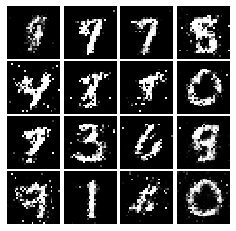

Epoch: 6, Iter: 2980, D: 1.323, G:0.8839


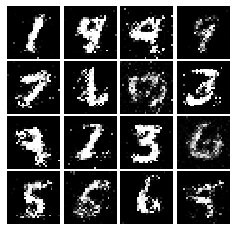

Epoch: 6, Iter: 3000, D: 1.361, G:0.8405


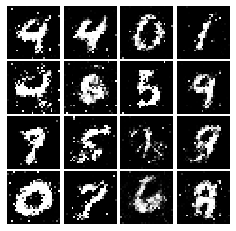

Epoch: 6, Iter: 3020, D: 1.346, G:0.7428


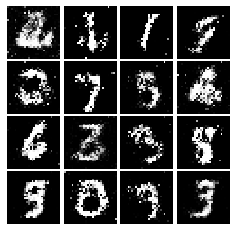

Epoch: 6, Iter: 3040, D: 1.406, G:0.7943


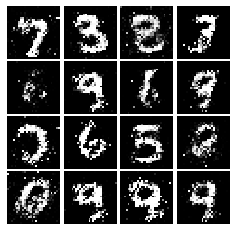

Epoch: 6, Iter: 3060, D: 1.442, G:0.8111


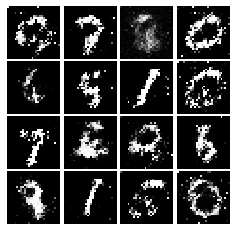

Epoch: 6, Iter: 3080, D: 1.449, G:0.7778


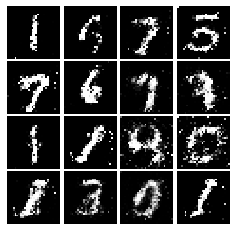

Epoch: 6, Iter: 3100, D: 1.28, G:0.7983


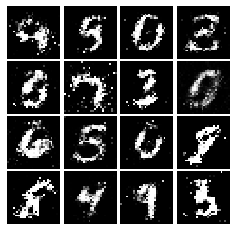

Epoch: 6, Iter: 3120, D: 1.273, G:0.7908


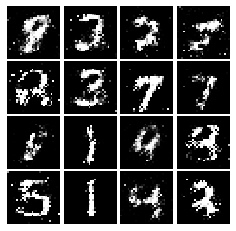

Epoch: 6, Iter: 3140, D: 1.364, G:0.7495


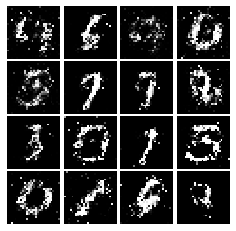

Epoch: 6, Iter: 3160, D: 1.355, G:0.8614


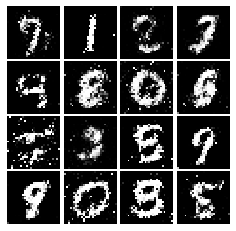

Epoch: 6, Iter: 3180, D: 1.323, G:0.805


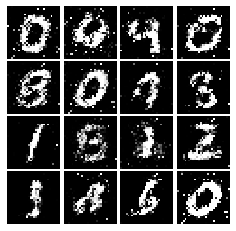

Epoch: 6, Iter: 3200, D: 1.309, G:0.8712


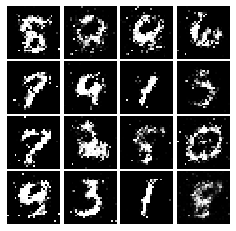

Epoch: 6, Iter: 3220, D: 1.321, G:0.741


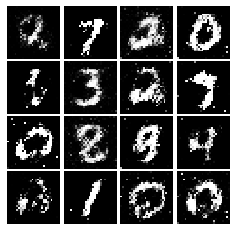

Epoch: 6, Iter: 3240, D: 1.307, G:0.7919


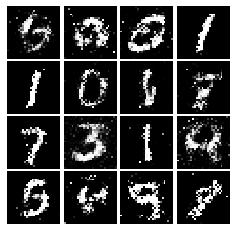

Epoch: 6, Iter: 3260, D: 1.37, G:0.7367


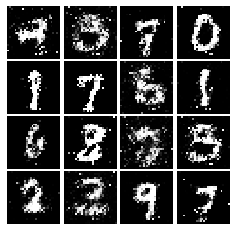

Epoch: 6, Iter: 3280, D: 1.267, G:0.9


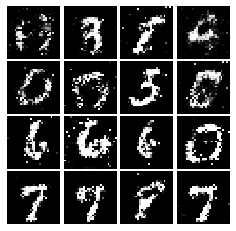

Epoch: 7, Iter: 3300, D: 1.287, G:0.8651


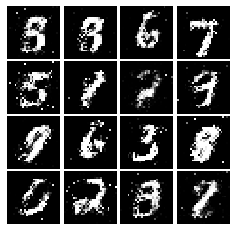

Epoch: 7, Iter: 3320, D: 1.355, G:0.8188


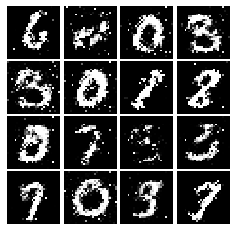

Epoch: 7, Iter: 3340, D: 1.314, G:0.8489


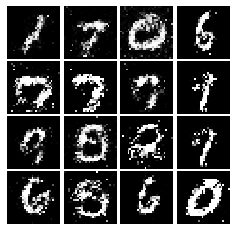

Epoch: 7, Iter: 3360, D: 1.425, G:0.7151


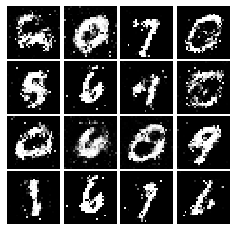

Epoch: 7, Iter: 3380, D: 1.325, G:0.8435


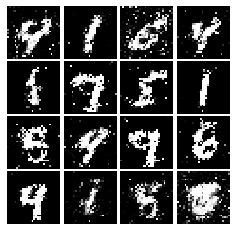

Epoch: 7, Iter: 3400, D: 1.365, G:0.9039


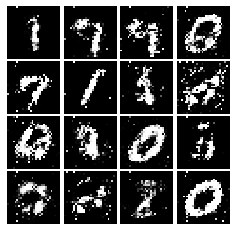

Epoch: 7, Iter: 3420, D: 1.35, G:0.8241


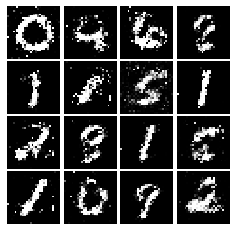

Epoch: 7, Iter: 3440, D: 1.298, G:0.9166


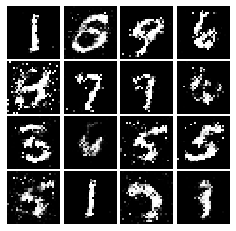

Epoch: 7, Iter: 3460, D: 1.264, G:0.8239


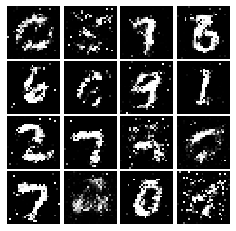

Epoch: 7, Iter: 3480, D: 1.371, G:0.8052


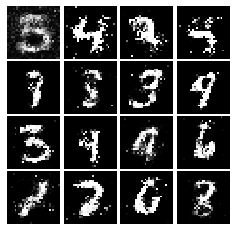

Epoch: 7, Iter: 3500, D: 1.269, G:0.7832


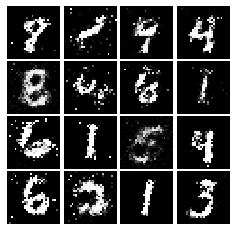

Epoch: 7, Iter: 3520, D: 1.469, G:0.8527


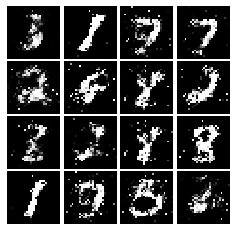

Epoch: 7, Iter: 3540, D: 1.257, G:0.7623


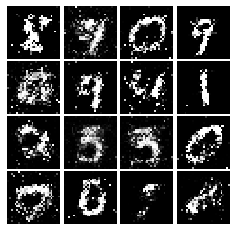

Epoch: 7, Iter: 3560, D: 1.216, G:0.8422


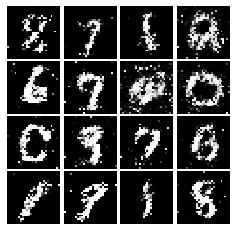

Epoch: 7, Iter: 3580, D: 1.287, G:0.8163


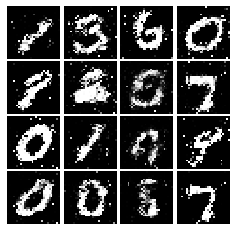

Epoch: 7, Iter: 3600, D: 1.304, G:0.8881


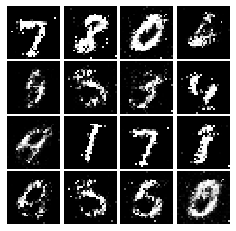

Epoch: 7, Iter: 3620, D: 1.372, G:0.8131


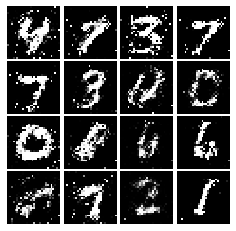

Epoch: 7, Iter: 3640, D: 1.286, G:0.7758


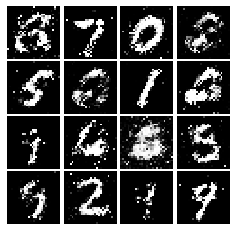

Epoch: 7, Iter: 3660, D: 1.403, G:0.8726


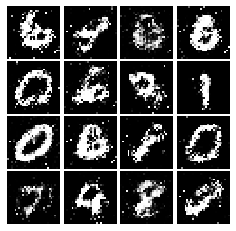

Epoch: 7, Iter: 3680, D: 1.28, G:0.816


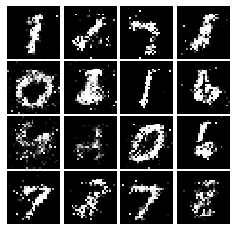

Epoch: 7, Iter: 3700, D: 1.299, G:0.8454


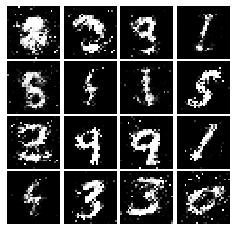

Epoch: 7, Iter: 3720, D: 1.318, G:0.811


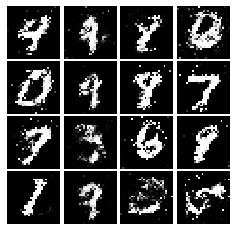

Epoch: 7, Iter: 3740, D: 1.364, G:0.7804


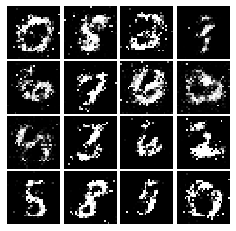

Epoch: 8, Iter: 3760, D: 1.389, G:0.8957


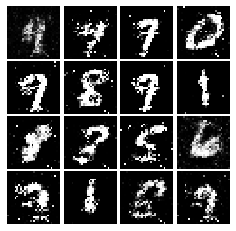

Epoch: 8, Iter: 3780, D: 1.324, G:0.8169


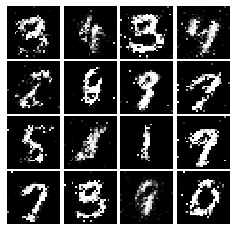

Epoch: 8, Iter: 3800, D: 1.215, G:0.8446


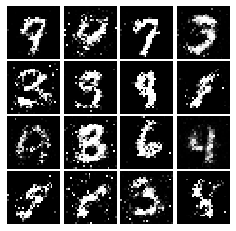

Epoch: 8, Iter: 3820, D: 1.313, G:0.7703


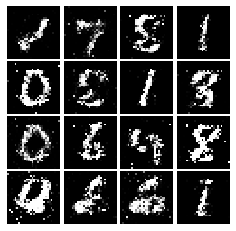

Epoch: 8, Iter: 3840, D: 1.332, G:0.7843


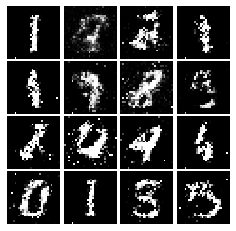

Epoch: 8, Iter: 3860, D: 1.318, G:0.7814


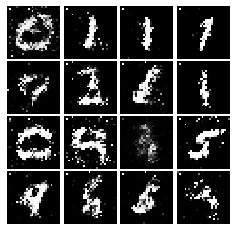

Epoch: 8, Iter: 3880, D: 1.287, G:1.177


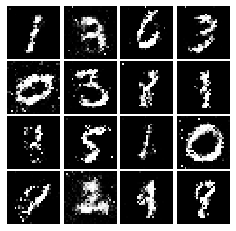

Epoch: 8, Iter: 3900, D: 1.364, G:0.7186


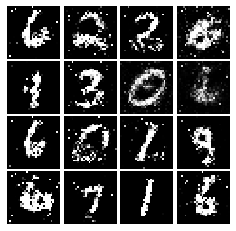

Epoch: 8, Iter: 3920, D: 1.28, G:0.8377


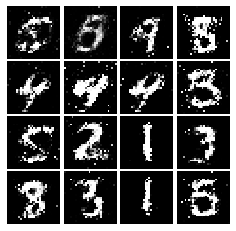

Epoch: 8, Iter: 3940, D: 1.31, G:0.8011


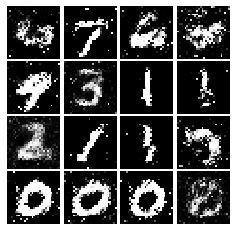

Epoch: 8, Iter: 3960, D: 1.371, G:0.8754


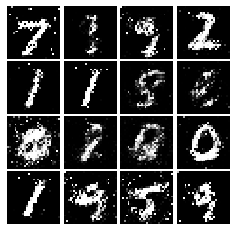

Epoch: 8, Iter: 3980, D: 1.637, G:0.4037


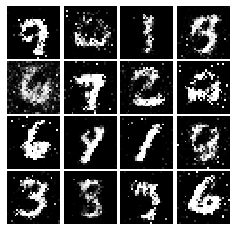

Epoch: 8, Iter: 4000, D: 1.248, G:0.8371


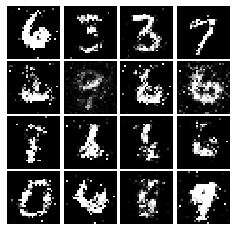

Epoch: 8, Iter: 4020, D: 1.367, G:0.6996


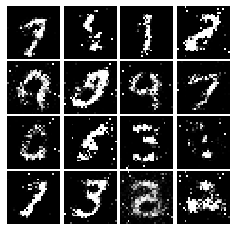

Epoch: 8, Iter: 4040, D: 1.301, G:0.8898


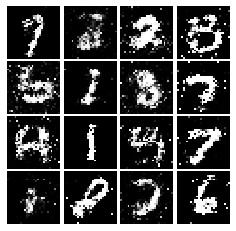

Epoch: 8, Iter: 4060, D: 1.314, G:0.8103


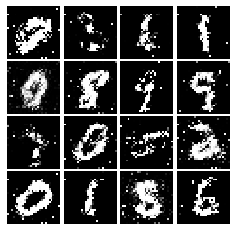

Epoch: 8, Iter: 4080, D: 1.324, G:0.7802


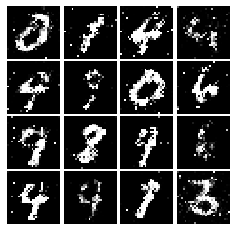

Epoch: 8, Iter: 4100, D: 1.369, G:0.8413


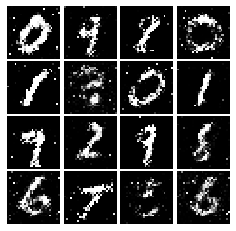

Epoch: 8, Iter: 4120, D: 1.347, G:0.7598


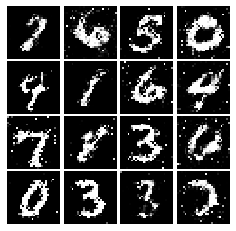

Epoch: 8, Iter: 4140, D: 1.278, G:0.8318


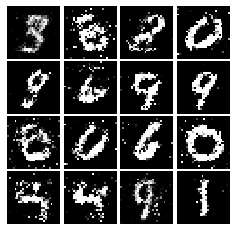

Epoch: 8, Iter: 4160, D: 1.374, G:0.8035


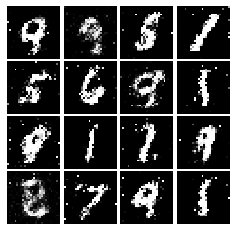

Epoch: 8, Iter: 4180, D: 1.41, G:0.8107


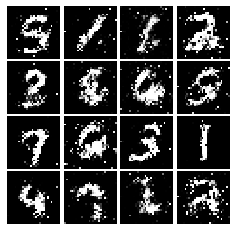

Epoch: 8, Iter: 4200, D: 1.326, G:0.7884


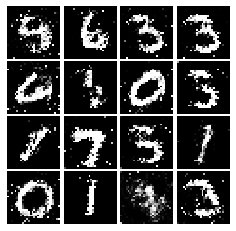

Epoch: 8, Iter: 4220, D: 1.411, G:0.8087


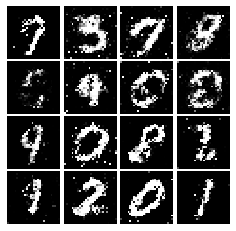

Epoch: 9, Iter: 4240, D: 1.355, G:0.7436


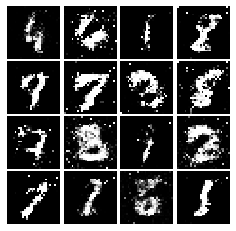

Epoch: 9, Iter: 4260, D: 1.278, G:0.778


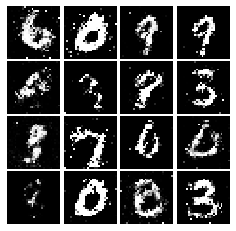

Epoch: 9, Iter: 4280, D: 1.329, G:0.7634


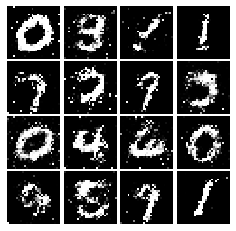

Epoch: 9, Iter: 4300, D: 1.38, G:0.8258


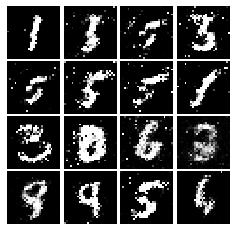

Epoch: 9, Iter: 4320, D: 1.33, G:0.8462


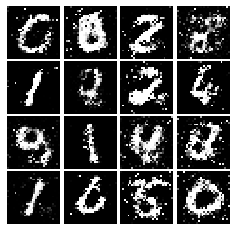

Epoch: 9, Iter: 4340, D: 1.366, G:0.769


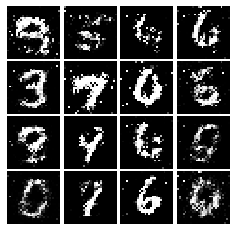

Epoch: 9, Iter: 4360, D: 1.352, G:0.9091


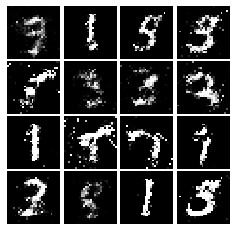

Epoch: 9, Iter: 4380, D: 1.383, G:0.796


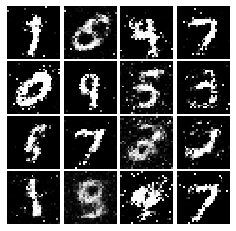

Epoch: 9, Iter: 4400, D: 1.328, G:0.8446


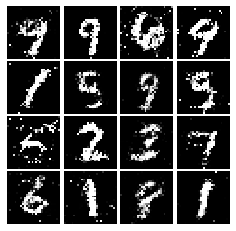

Epoch: 9, Iter: 4420, D: 1.331, G:0.7482


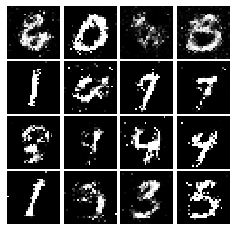

Epoch: 9, Iter: 4440, D: 1.422, G:0.71


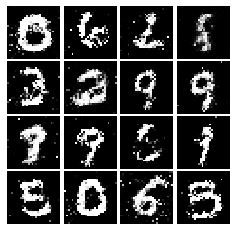

Epoch: 9, Iter: 4460, D: 1.33, G:0.7675


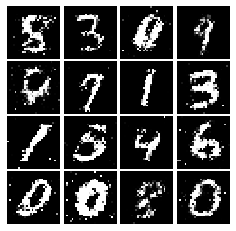

Epoch: 9, Iter: 4480, D: 1.242, G:0.8701


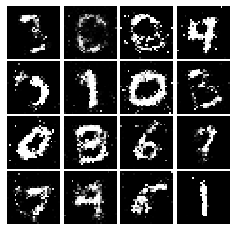

Epoch: 9, Iter: 4500, D: 1.443, G:0.7964


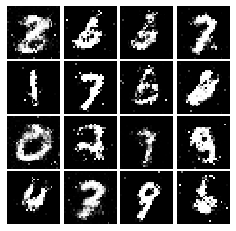

Epoch: 9, Iter: 4520, D: 1.358, G:0.7225


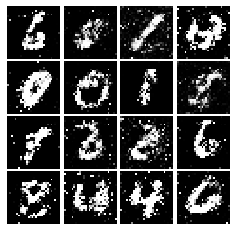

Epoch: 9, Iter: 4540, D: 1.427, G:0.7648


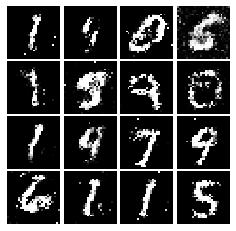

Epoch: 9, Iter: 4560, D: 1.372, G:0.738


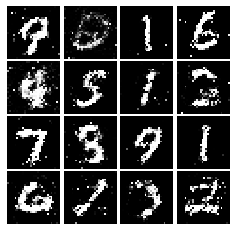

Epoch: 9, Iter: 4580, D: 1.302, G:0.7451


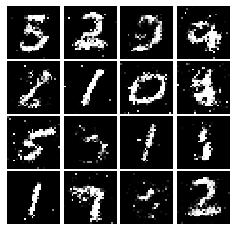

Epoch: 9, Iter: 4600, D: 1.406, G:0.7529


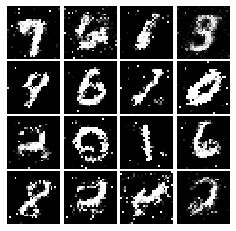

Epoch: 9, Iter: 4620, D: 1.335, G:0.7511


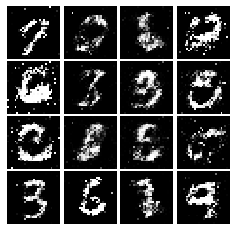

Epoch: 9, Iter: 4640, D: 1.352, G:0.8262


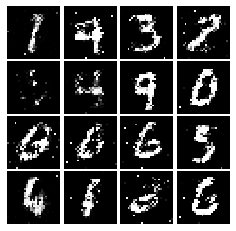

Epoch: 9, Iter: 4660, D: 1.426, G:0.8017


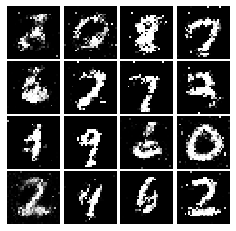

Epoch: 9, Iter: 4680, D: 1.337, G:0.766


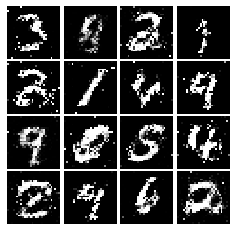

Final images


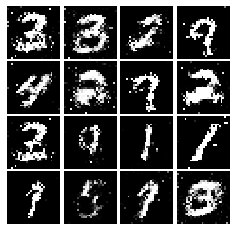

In [22]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [25]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_real-1)) + 0.5 * tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake-1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [26]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.6366, G:0.4282


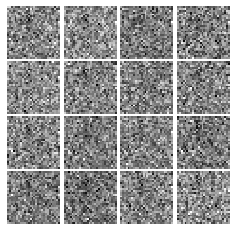

Epoch: 0, Iter: 20, D: 0.06925, G:1.257


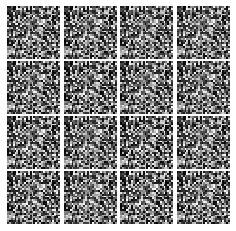

Epoch: 0, Iter: 40, D: 0.0153, G:0.5098


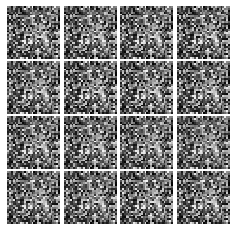

Epoch: 0, Iter: 60, D: 0.03363, G:0.877


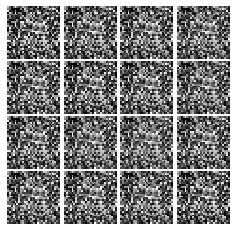

Epoch: 0, Iter: 80, D: 0.05484, G:0.4458


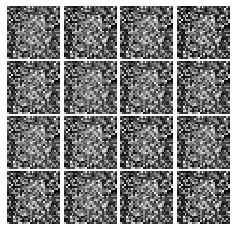

Epoch: 0, Iter: 100, D: 0.03354, G:0.4423


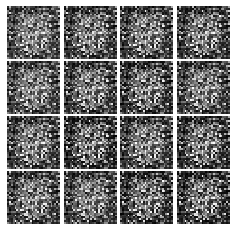

Epoch: 0, Iter: 120, D: 0.04527, G:0.4857


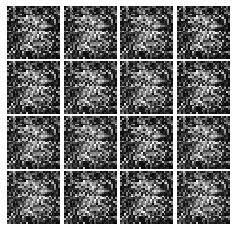

Epoch: 0, Iter: 140, D: 0.09405, G:0.66


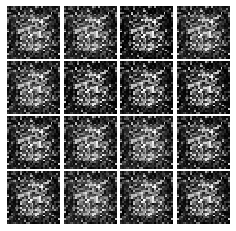

Epoch: 0, Iter: 160, D: 0.08545, G:0.7374


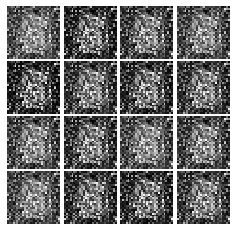

Epoch: 0, Iter: 180, D: 0.1224, G:0.5152


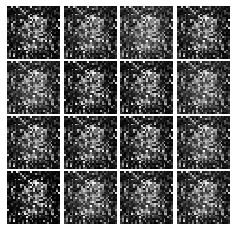

Epoch: 0, Iter: 200, D: 0.1285, G:0.3196


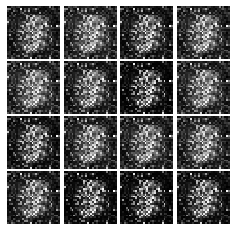

Epoch: 0, Iter: 220, D: 0.2108, G:0.3101


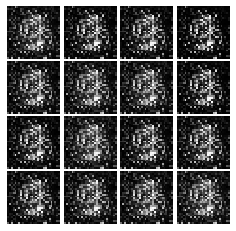

Epoch: 0, Iter: 240, D: 0.0674, G:0.5233


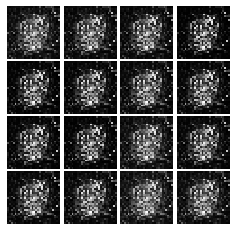

Epoch: 0, Iter: 260, D: 0.1689, G:0.3064


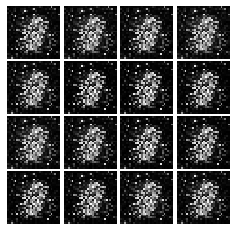

Epoch: 0, Iter: 280, D: 0.2283, G:0.6481


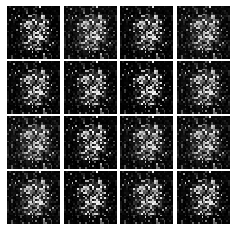

Epoch: 0, Iter: 300, D: 0.2138, G:0.3679


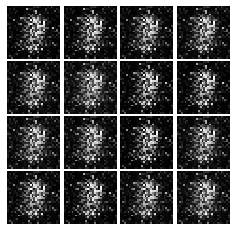

Epoch: 0, Iter: 320, D: 0.1178, G:0.7718


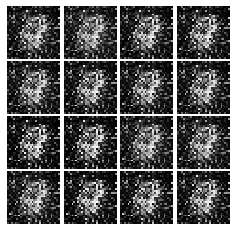

Epoch: 0, Iter: 340, D: 0.1934, G:0.2423


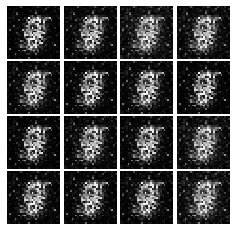

Epoch: 0, Iter: 360, D: 0.08894, G:0.6897


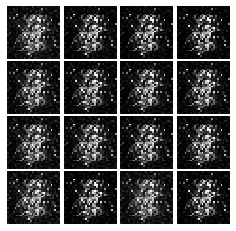

Epoch: 0, Iter: 380, D: 0.425, G:0.1586


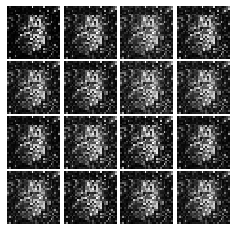

Epoch: 0, Iter: 400, D: 0.08345, G:0.5631


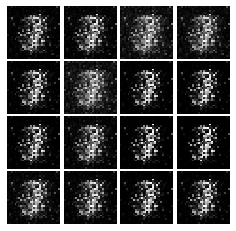

Epoch: 0, Iter: 420, D: 0.1337, G:0.4209


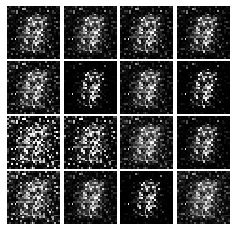

Epoch: 0, Iter: 440, D: 0.1145, G:0.4155


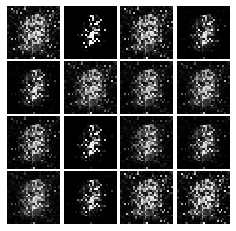

Epoch: 0, Iter: 460, D: 0.1485, G:0.1916


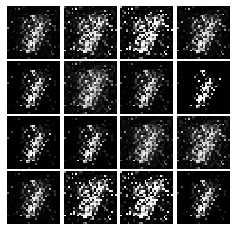

Epoch: 1, Iter: 480, D: 0.1108, G:0.3349


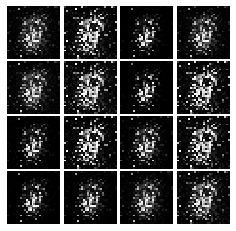

Epoch: 1, Iter: 500, D: 0.06165, G:0.3374


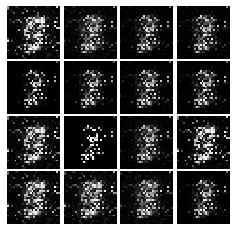

Epoch: 1, Iter: 520, D: 0.1133, G:0.6086


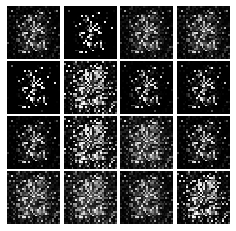

Epoch: 1, Iter: 540, D: 0.1525, G:0.5616


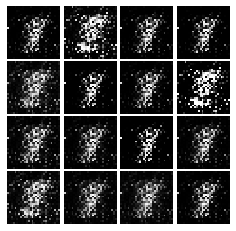

Epoch: 1, Iter: 560, D: 0.0713, G:0.5036


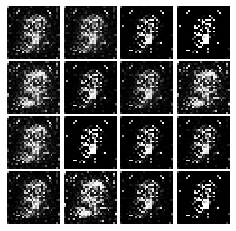

Epoch: 1, Iter: 580, D: 0.07759, G:0.421


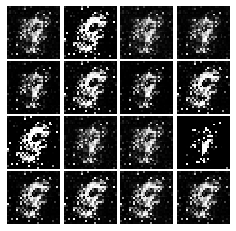

Epoch: 1, Iter: 600, D: 0.1582, G:0.1122


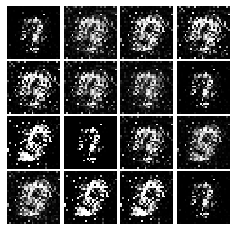

Epoch: 1, Iter: 620, D: 0.1016, G:0.3966


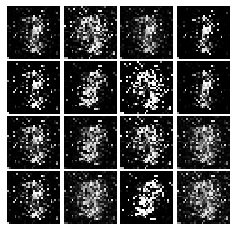

Epoch: 1, Iter: 640, D: 0.1987, G:0.3288


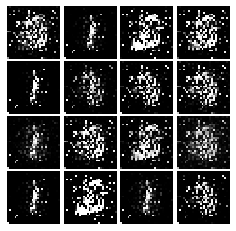

Epoch: 1, Iter: 660, D: 0.1224, G:0.489


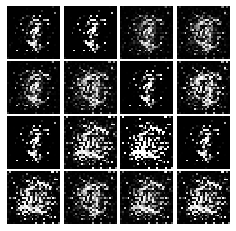

Epoch: 1, Iter: 680, D: 0.0898, G:0.4717


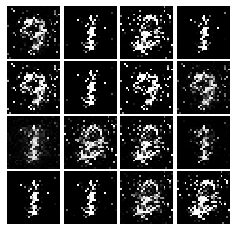

Epoch: 1, Iter: 700, D: 0.1376, G:0.435


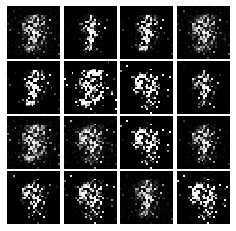

Epoch: 1, Iter: 720, D: 0.2979, G:0.4661


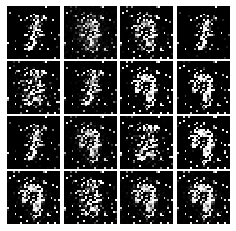

Epoch: 1, Iter: 740, D: 0.5322, G:0.2528


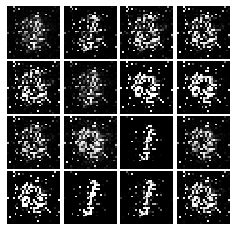

Epoch: 1, Iter: 760, D: 0.09376, G:0.3265


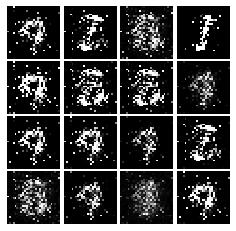

Epoch: 1, Iter: 780, D: 0.09837, G:1.19


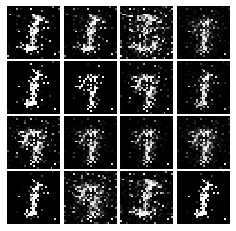

Epoch: 1, Iter: 800, D: 0.1172, G:0.3524


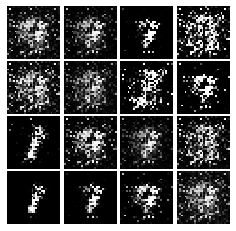

Epoch: 1, Iter: 820, D: 0.1353, G:0.4269


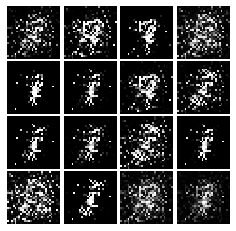

Epoch: 1, Iter: 840, D: 0.1087, G:0.373


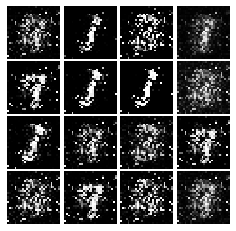

Epoch: 1, Iter: 860, D: 0.1576, G:0.3828


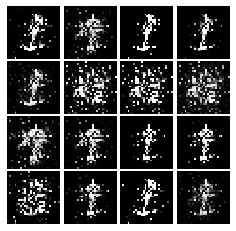

Epoch: 1, Iter: 880, D: 0.1489, G:0.3234


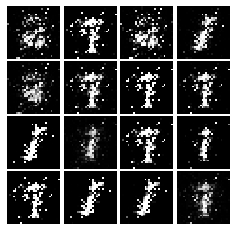

Epoch: 1, Iter: 900, D: 0.2626, G:0.6507


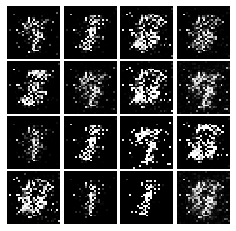

Epoch: 1, Iter: 920, D: 0.1378, G:0.3381


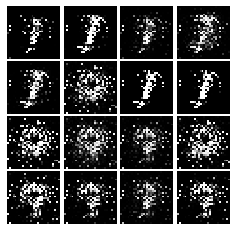

Epoch: 2, Iter: 940, D: 0.126, G:0.4139


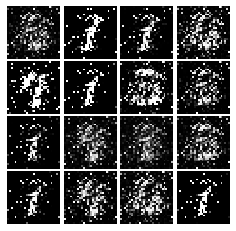

Epoch: 2, Iter: 960, D: 0.1052, G:0.3714


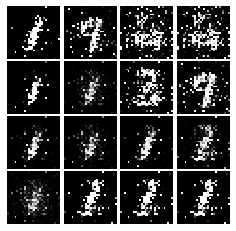

Epoch: 2, Iter: 980, D: 0.169, G:0.7514


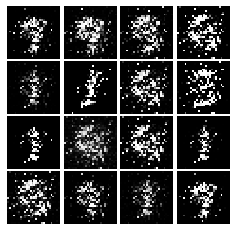

Epoch: 2, Iter: 1000, D: 0.4116, G:0.3686


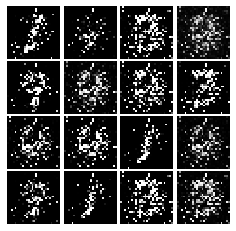

Epoch: 2, Iter: 1020, D: 0.1599, G:0.4182


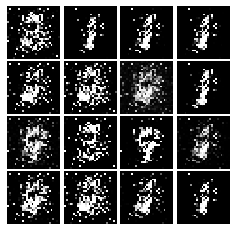

Epoch: 2, Iter: 1040, D: 0.07013, G:0.4642


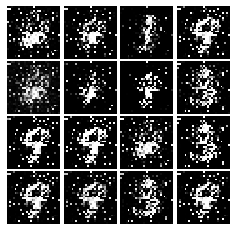

Epoch: 2, Iter: 1060, D: 0.1161, G:0.387


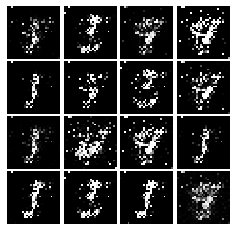

Epoch: 2, Iter: 1080, D: 0.1056, G:0.8666


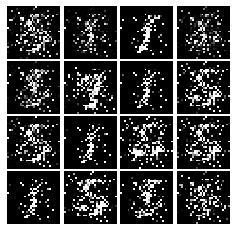

Epoch: 2, Iter: 1100, D: 0.09446, G:0.5011


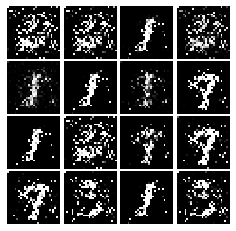

Epoch: 2, Iter: 1120, D: 0.1004, G:0.3452


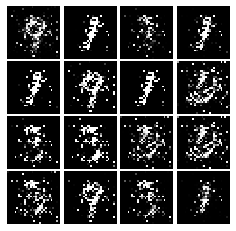

Epoch: 2, Iter: 1140, D: 0.06907, G:0.3891


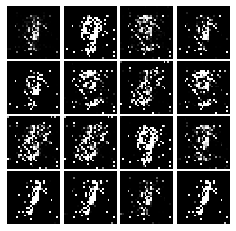

Epoch: 2, Iter: 1160, D: 0.0551, G:0.6247


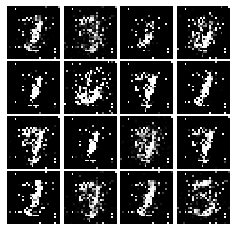

Epoch: 2, Iter: 1180, D: 0.07033, G:0.4375


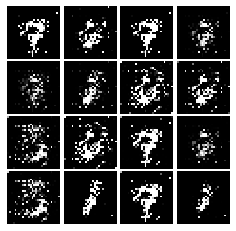

Epoch: 2, Iter: 1200, D: 0.118, G:0.395


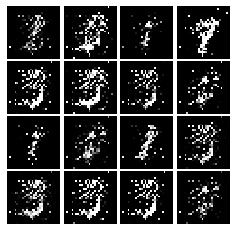

Epoch: 2, Iter: 1220, D: 0.1138, G:0.5624


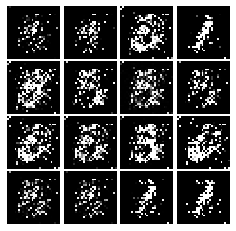

Epoch: 2, Iter: 1240, D: 0.1108, G:0.3383


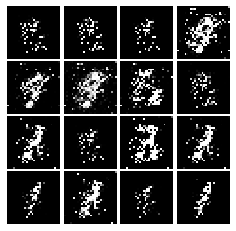

Epoch: 2, Iter: 1260, D: 0.2024, G:0.1572


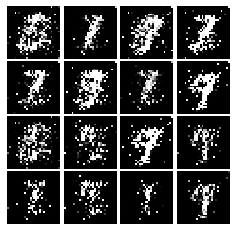

Epoch: 2, Iter: 1280, D: 0.1104, G:0.3159


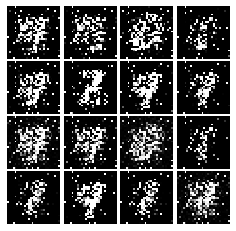

Epoch: 2, Iter: 1300, D: 0.1519, G:0.3635


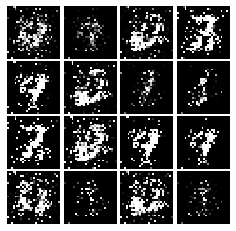

Epoch: 2, Iter: 1320, D: 0.2601, G:0.08675


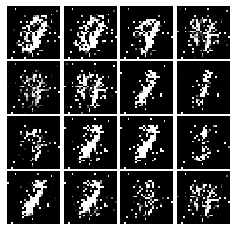

Epoch: 2, Iter: 1340, D: 0.2558, G:0.2569


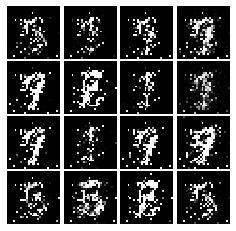

Epoch: 2, Iter: 1360, D: 0.1099, G:0.3406


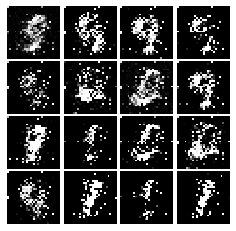

Epoch: 2, Iter: 1380, D: 0.3675, G:0.1824


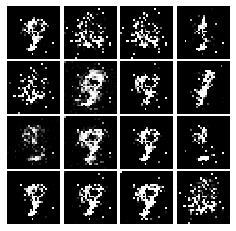

Epoch: 2, Iter: 1400, D: 0.1866, G:0.2254


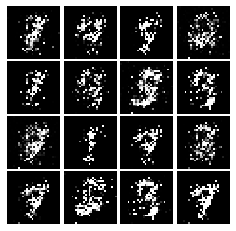

Epoch: 3, Iter: 1420, D: 0.3992, G:1.007


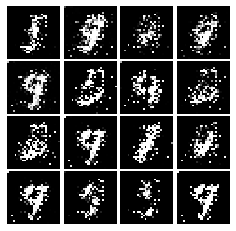

Epoch: 3, Iter: 1440, D: 0.1822, G:0.3485


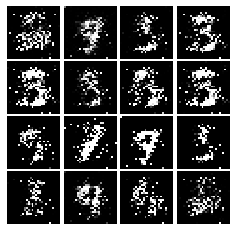

Epoch: 3, Iter: 1460, D: 0.1203, G:0.2906


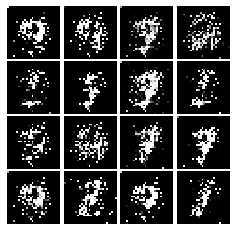

Epoch: 3, Iter: 1480, D: 0.09582, G:0.3096


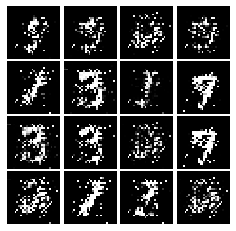

Epoch: 3, Iter: 1500, D: 0.1399, G:0.2987


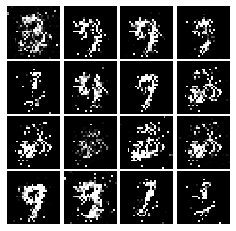

Epoch: 3, Iter: 1520, D: 0.1571, G:0.2463


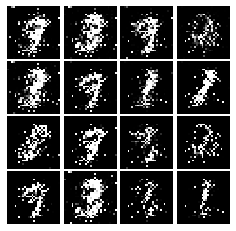

Epoch: 3, Iter: 1540, D: 0.1415, G:0.3009


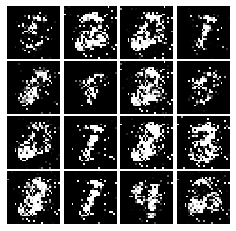

Epoch: 3, Iter: 1560, D: 0.1805, G:0.2547


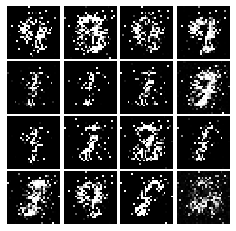

Epoch: 3, Iter: 1580, D: 0.2011, G:0.3185


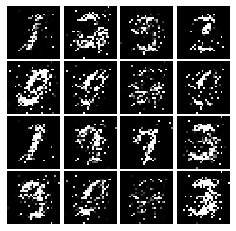

Epoch: 3, Iter: 1600, D: 0.1776, G:0.2822


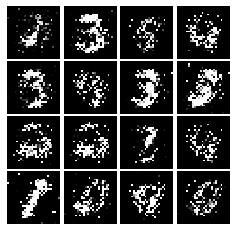

Epoch: 3, Iter: 1620, D: 0.1479, G:0.314


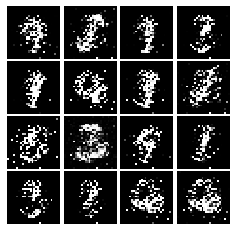

Epoch: 3, Iter: 1640, D: 0.4512, G:0.1625


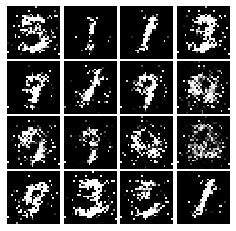

Epoch: 3, Iter: 1660, D: 0.1535, G:0.2602


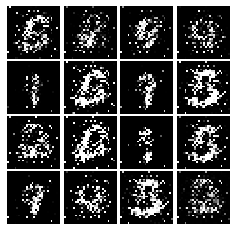

Epoch: 3, Iter: 1680, D: 0.1359, G:0.33


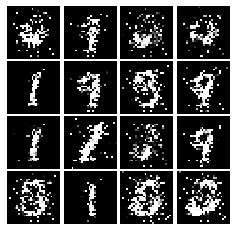

Epoch: 3, Iter: 1700, D: 0.2071, G:0.1922


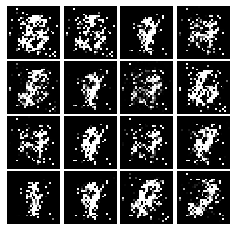

Epoch: 3, Iter: 1720, D: 0.285, G:0.1519


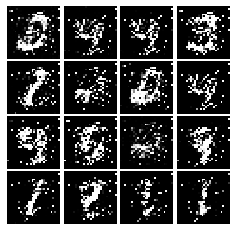

Epoch: 3, Iter: 1740, D: 0.1793, G:0.2377


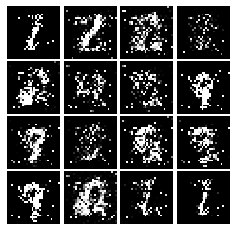

Epoch: 3, Iter: 1760, D: 0.1417, G:0.4272


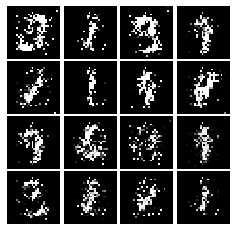

Epoch: 3, Iter: 1780, D: 0.1658, G:0.8233


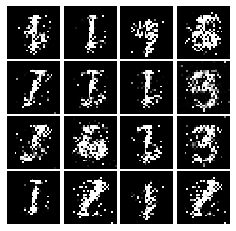

Epoch: 3, Iter: 1800, D: 0.1772, G:0.2614


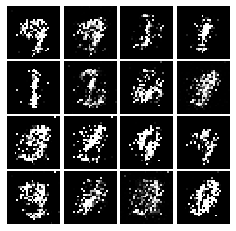

Epoch: 3, Iter: 1820, D: 0.1723, G:0.2991


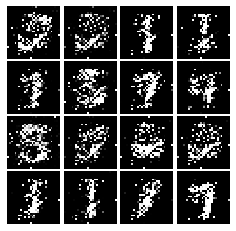

Epoch: 3, Iter: 1840, D: 0.188, G:0.32


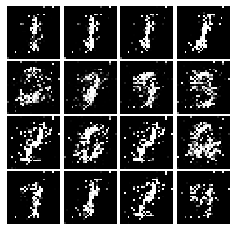

Epoch: 3, Iter: 1860, D: 0.1584, G:0.2868


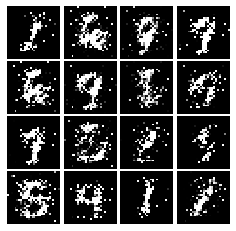

Epoch: 4, Iter: 1880, D: 0.1683, G:0.2452


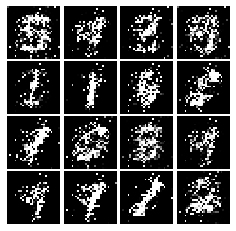

Epoch: 4, Iter: 1900, D: 0.2309, G:0.03691


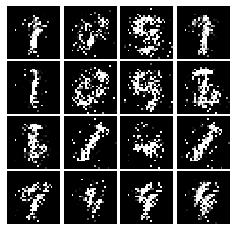

Epoch: 4, Iter: 1920, D: 0.159, G:0.2621


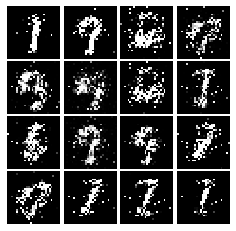

Epoch: 4, Iter: 1940, D: 0.1833, G:0.3083


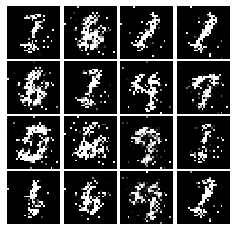

Epoch: 4, Iter: 1960, D: 0.1301, G:0.944


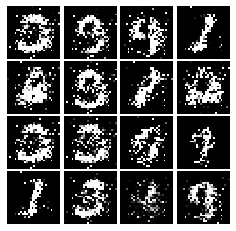

Epoch: 4, Iter: 1980, D: 0.1669, G:0.2419


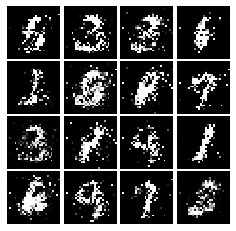

Epoch: 4, Iter: 2000, D: 0.1619, G:0.2502


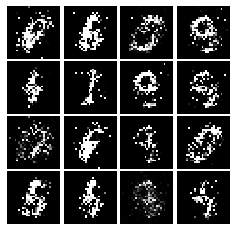

Epoch: 4, Iter: 2020, D: 0.1796, G:0.2684


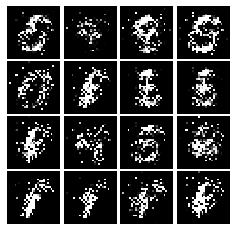

Epoch: 4, Iter: 2040, D: 0.1724, G:0.2933


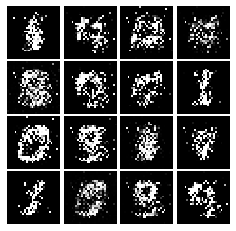

Epoch: 4, Iter: 2060, D: 0.1812, G:0.3411


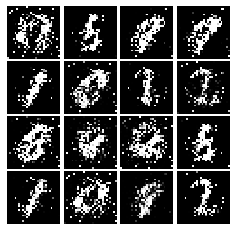

Epoch: 4, Iter: 2080, D: 0.2116, G:0.2228


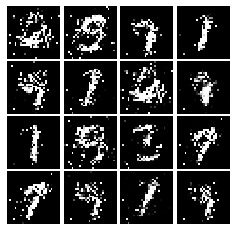

Epoch: 4, Iter: 2100, D: 0.1945, G:0.1888


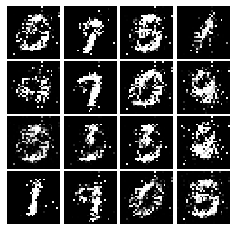

Epoch: 4, Iter: 2120, D: 0.1754, G:0.2247


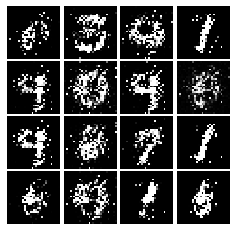

Epoch: 4, Iter: 2140, D: 0.1811, G:0.248


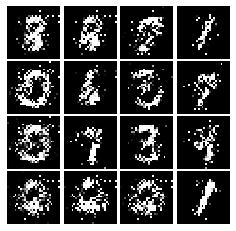

Epoch: 4, Iter: 2160, D: 0.2079, G:0.2402


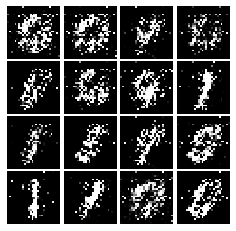

Epoch: 4, Iter: 2180, D: 0.9885, G:0.03329


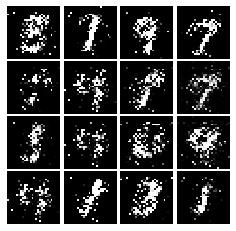

Epoch: 4, Iter: 2200, D: 0.1762, G:0.2779


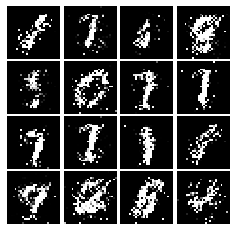

Epoch: 4, Iter: 2220, D: 0.2102, G:0.2062


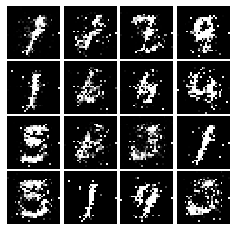

Epoch: 4, Iter: 2240, D: 0.1739, G:0.3168


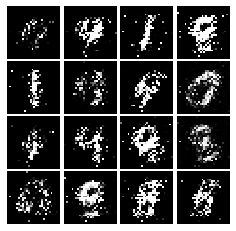

Epoch: 4, Iter: 2260, D: 0.1958, G:0.2758


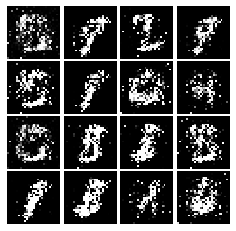

Epoch: 4, Iter: 2280, D: 0.2064, G:0.207


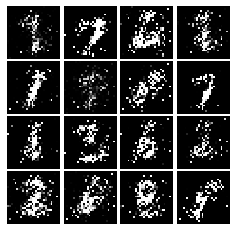

Epoch: 4, Iter: 2300, D: 0.1731, G:0.2507


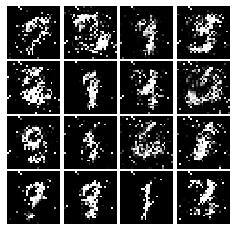

Epoch: 4, Iter: 2320, D: 0.1782, G:0.1959


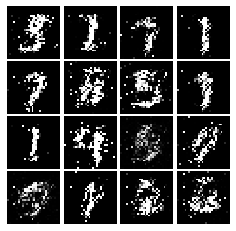

Epoch: 4, Iter: 2340, D: 0.1688, G:0.2825


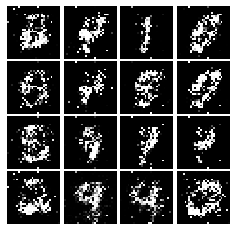

Epoch: 5, Iter: 2360, D: 0.1978, G:0.2492


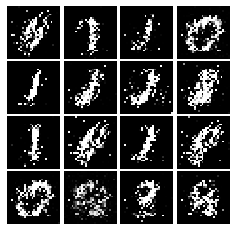

Epoch: 5, Iter: 2380, D: 0.194, G:0.2482


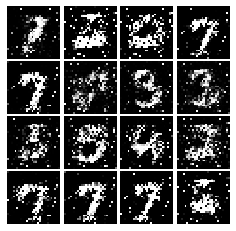

Epoch: 5, Iter: 2400, D: 0.2212, G:0.2078


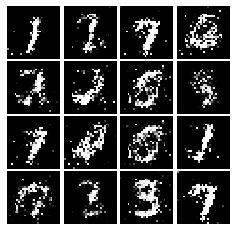

Epoch: 5, Iter: 2420, D: 0.1972, G:0.2877


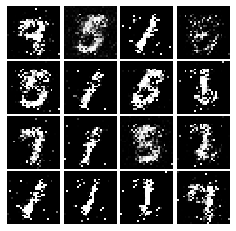

Epoch: 5, Iter: 2440, D: 0.1577, G:0.3077


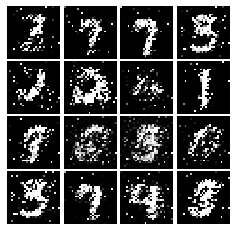

Epoch: 5, Iter: 2460, D: 0.2003, G:0.2397


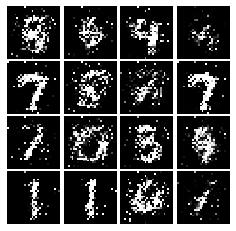

Epoch: 5, Iter: 2480, D: 0.2017, G:0.2319


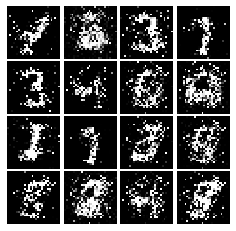

Epoch: 5, Iter: 2500, D: 0.206, G:0.2824


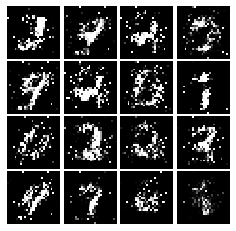

Epoch: 5, Iter: 2520, D: 0.2393, G:0.153


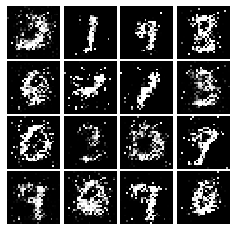

Epoch: 5, Iter: 2540, D: 0.1987, G:0.2177


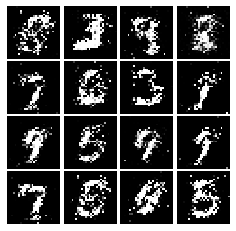

Epoch: 5, Iter: 2560, D: 0.2466, G:0.2067


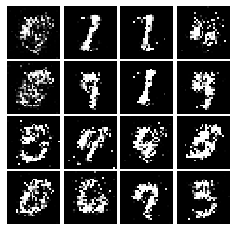

Epoch: 5, Iter: 2580, D: 0.1936, G:0.2193


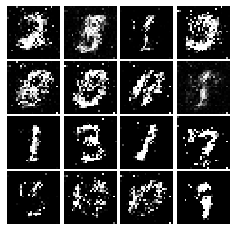

Epoch: 5, Iter: 2600, D: 0.26, G:0.1444


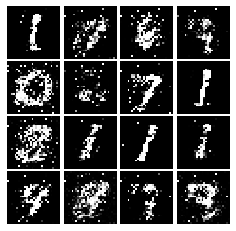

Epoch: 5, Iter: 2620, D: 0.2295, G:0.1996


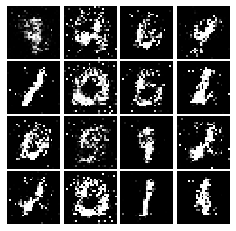

Epoch: 5, Iter: 2640, D: 0.2128, G:0.185


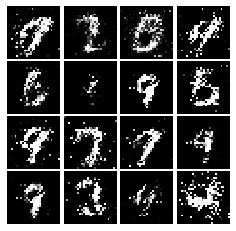

Epoch: 5, Iter: 2660, D: 0.2257, G:0.1898


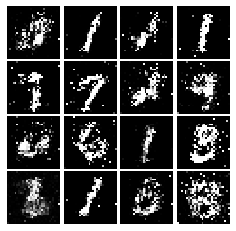

Epoch: 5, Iter: 2680, D: 0.2492, G:0.1546


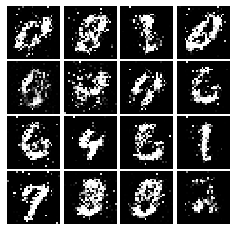

Epoch: 5, Iter: 2700, D: 0.2156, G:0.1789


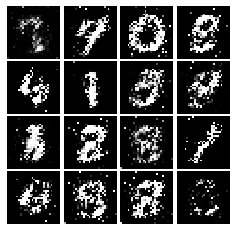

Epoch: 5, Iter: 2720, D: 0.2074, G:0.1656


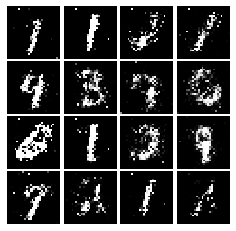

Epoch: 5, Iter: 2740, D: 0.2171, G:0.1836


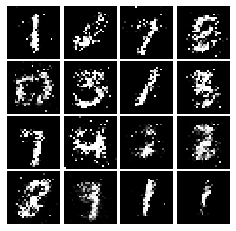

Epoch: 5, Iter: 2760, D: 0.2331, G:0.1728


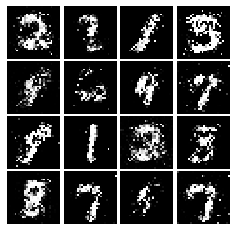

Epoch: 5, Iter: 2780, D: 0.2386, G:0.1761


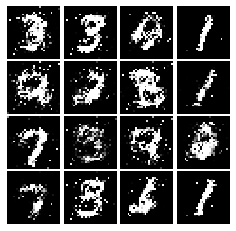

Epoch: 5, Iter: 2800, D: 0.2459, G:0.1617


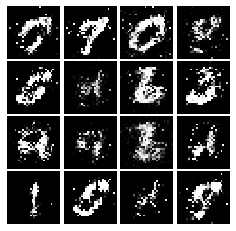

Epoch: 6, Iter: 2820, D: 0.2324, G:0.1822


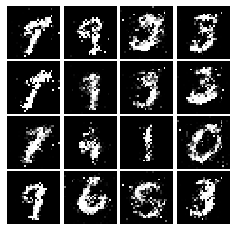

Epoch: 6, Iter: 2840, D: 0.2196, G:0.1831


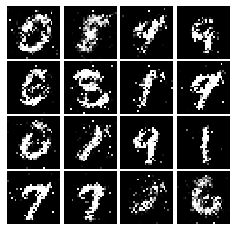

Epoch: 6, Iter: 2860, D: 0.2376, G:0.1991


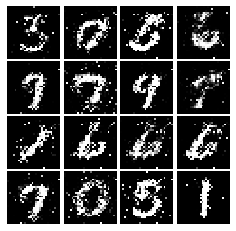

Epoch: 6, Iter: 2880, D: 0.2288, G:0.2057


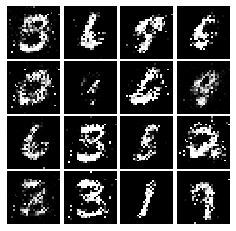

Epoch: 6, Iter: 2900, D: 0.2851, G:0.1555


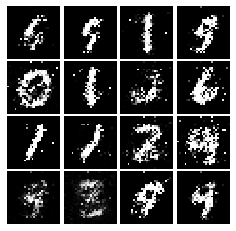

Epoch: 6, Iter: 2920, D: 0.2399, G:0.1495


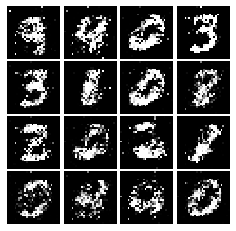

Epoch: 6, Iter: 2940, D: 0.2501, G:0.1553


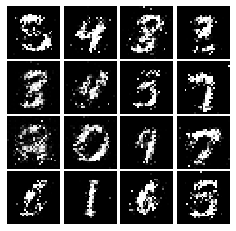

Epoch: 6, Iter: 2960, D: 0.2319, G:0.1584


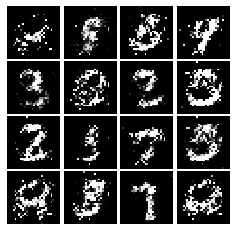

Epoch: 6, Iter: 2980, D: 0.2196, G:0.1667


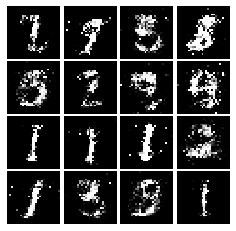

Epoch: 6, Iter: 3000, D: 0.2283, G:0.1647


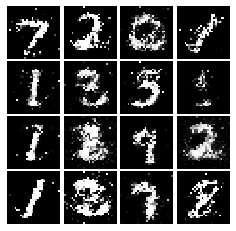

Epoch: 6, Iter: 3020, D: 0.2307, G:0.1605


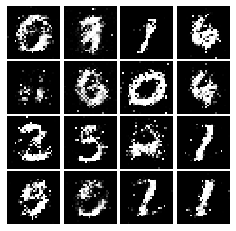

Epoch: 6, Iter: 3040, D: 0.2322, G:0.1682


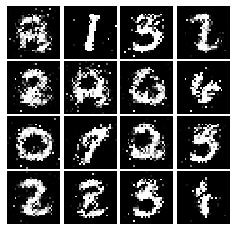

Epoch: 6, Iter: 3060, D: 0.2253, G:0.1773


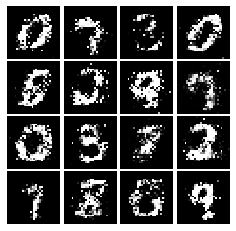

Epoch: 6, Iter: 3080, D: 0.218, G:0.1655


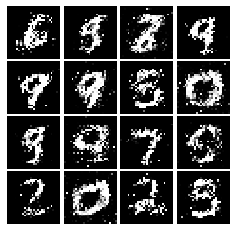

Epoch: 6, Iter: 3100, D: 0.2182, G:0.2063


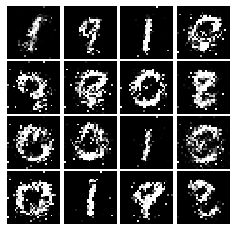

Epoch: 6, Iter: 3120, D: 0.2356, G:0.1763


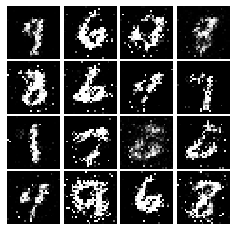

Epoch: 6, Iter: 3140, D: 0.2582, G:0.1759


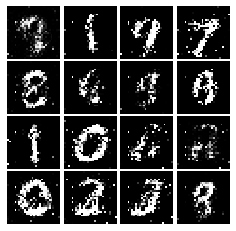

Epoch: 6, Iter: 3160, D: 0.2065, G:0.2032


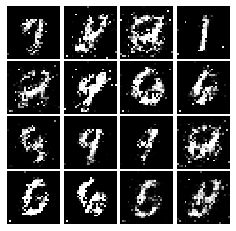

Epoch: 6, Iter: 3180, D: 0.2221, G:0.1378


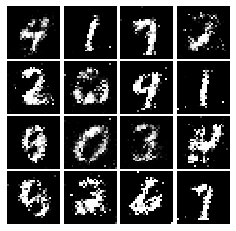

Epoch: 6, Iter: 3200, D: 0.2196, G:0.2115


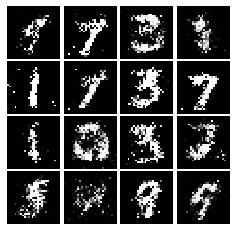

Epoch: 6, Iter: 3220, D: 0.245, G:0.1695


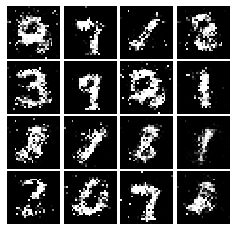

Epoch: 6, Iter: 3240, D: 0.2043, G:0.1832


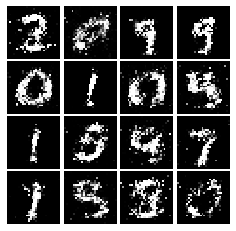

Epoch: 6, Iter: 3260, D: 0.2612, G:0.1599


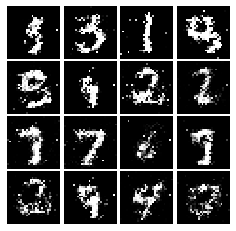

Epoch: 6, Iter: 3280, D: 0.2376, G:0.1484


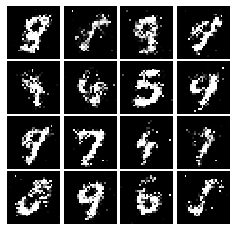

Epoch: 7, Iter: 3300, D: 0.224, G:0.1952


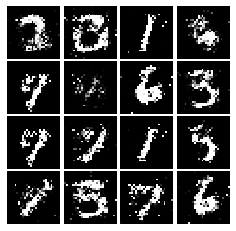

Epoch: 7, Iter: 3320, D: 0.2027, G:0.1841


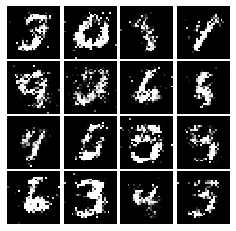

Epoch: 7, Iter: 3340, D: 0.2297, G:0.1889


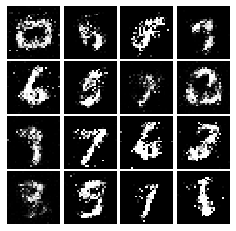

Epoch: 7, Iter: 3360, D: 0.2397, G:0.1667


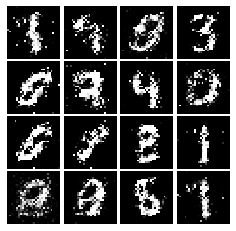

Epoch: 7, Iter: 3380, D: 0.1967, G:0.1785


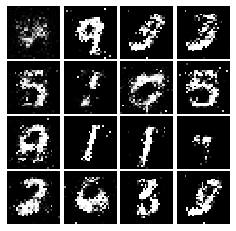

Epoch: 7, Iter: 3400, D: 0.2374, G:0.1772


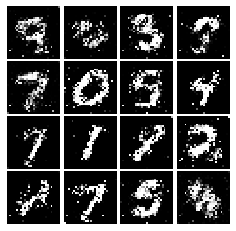

Epoch: 7, Iter: 3420, D: 0.2392, G:0.1717


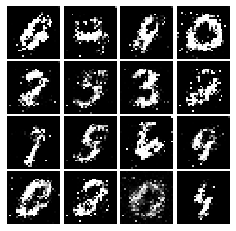

Epoch: 7, Iter: 3440, D: 0.2361, G:0.1581


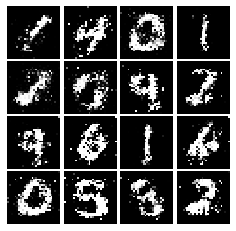

Epoch: 7, Iter: 3460, D: 0.237, G:0.1956


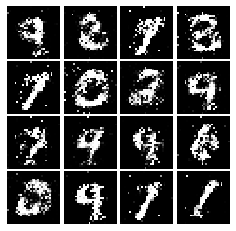

Epoch: 7, Iter: 3480, D: 0.2399, G:0.1637


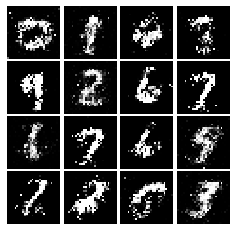

Epoch: 7, Iter: 3500, D: 0.2183, G:0.1566


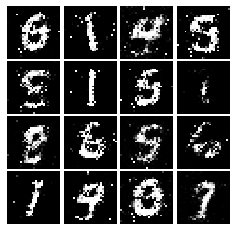

Epoch: 7, Iter: 3520, D: 0.2288, G:0.2473


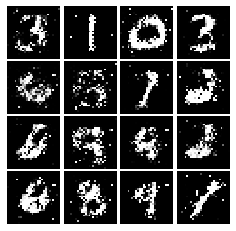

Epoch: 7, Iter: 3540, D: 0.2269, G:0.1875


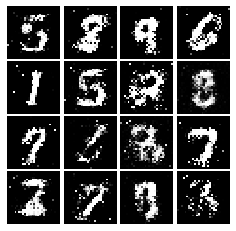

Epoch: 7, Iter: 3560, D: 0.2234, G:0.1708


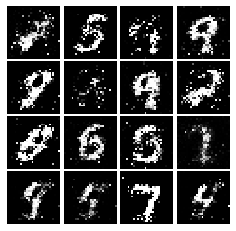

Epoch: 7, Iter: 3580, D: 0.2254, G:0.1747


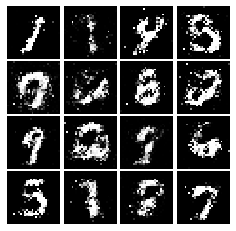

Epoch: 7, Iter: 3600, D: 0.2637, G:0.1737


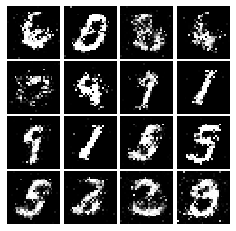

Epoch: 7, Iter: 3620, D: 0.2075, G:0.1711


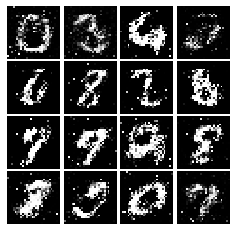

Epoch: 7, Iter: 3640, D: 0.2165, G:0.1768


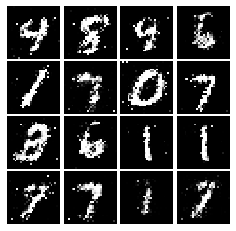

Epoch: 7, Iter: 3660, D: 0.2187, G:0.1919


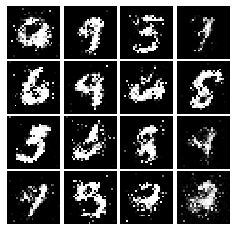

Epoch: 7, Iter: 3680, D: 0.2448, G:0.2141


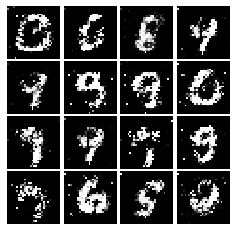

Epoch: 7, Iter: 3700, D: 0.2453, G:0.1767


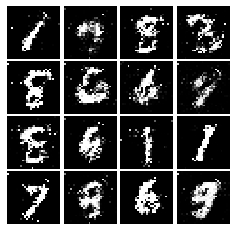

Epoch: 7, Iter: 3720, D: 0.2174, G:0.179


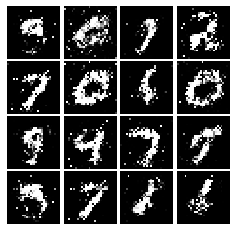

Epoch: 7, Iter: 3740, D: 0.2588, G:0.1617


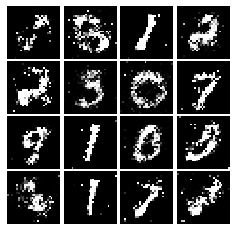

Epoch: 8, Iter: 3760, D: 0.2387, G:0.1611


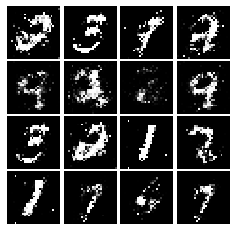

Epoch: 8, Iter: 3780, D: 0.2667, G:0.1521


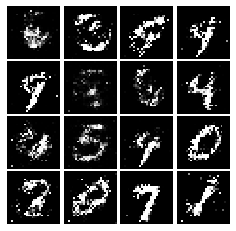

Epoch: 8, Iter: 3800, D: 0.2364, G:0.1776


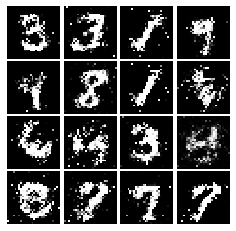

Epoch: 8, Iter: 3820, D: 0.2284, G:0.1792


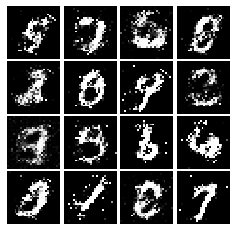

Epoch: 8, Iter: 3840, D: 0.2349, G:0.1653


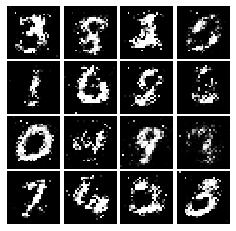

Epoch: 8, Iter: 3860, D: 0.2379, G:0.296


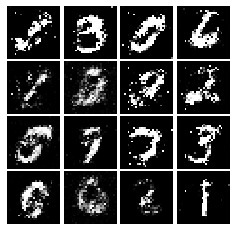

Epoch: 8, Iter: 3880, D: 0.2303, G:0.1724


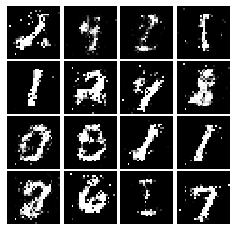

Epoch: 8, Iter: 3900, D: 0.231, G:0.1608


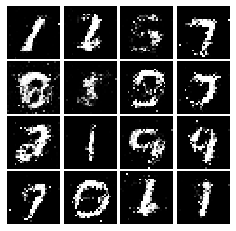

Epoch: 8, Iter: 3920, D: 0.1894, G:0.1757


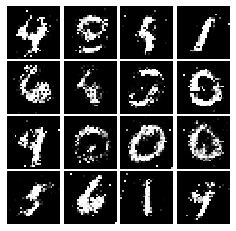

Epoch: 8, Iter: 3940, D: 0.2321, G:0.1517


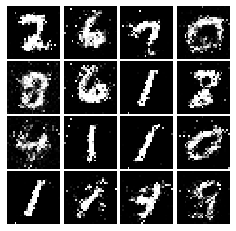

Epoch: 8, Iter: 3960, D: 0.2262, G:0.1742


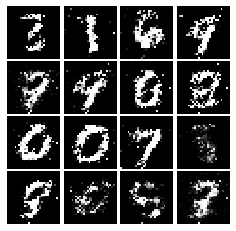

Epoch: 8, Iter: 3980, D: 0.2257, G:0.1651


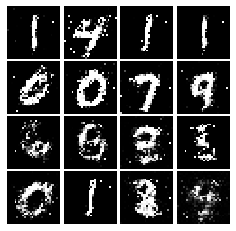

Epoch: 8, Iter: 4000, D: 0.2055, G:0.1733


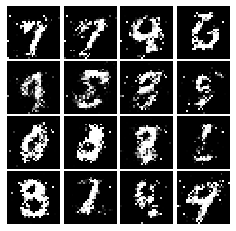

Epoch: 8, Iter: 4020, D: 0.226, G:0.162


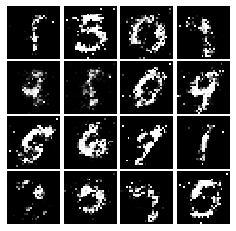

Epoch: 8, Iter: 4040, D: 0.222, G:0.1764


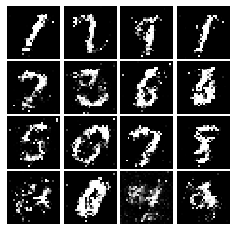

Epoch: 8, Iter: 4060, D: 0.2168, G:0.1573


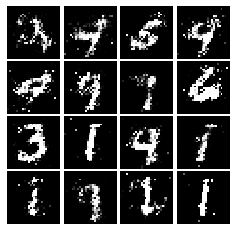

Epoch: 8, Iter: 4080, D: 0.2456, G:0.1843


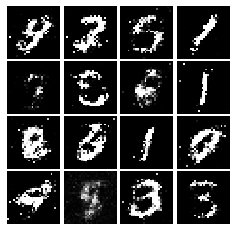

Epoch: 8, Iter: 4100, D: 0.2423, G:0.1916


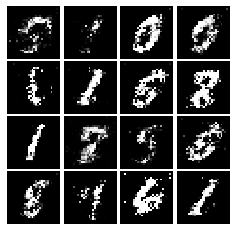

Epoch: 8, Iter: 4120, D: 0.2355, G:0.1559


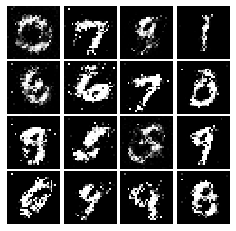

Epoch: 8, Iter: 4140, D: 0.2429, G:0.1676


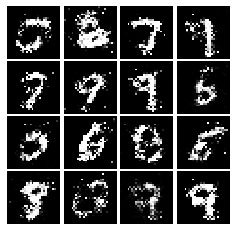

Epoch: 8, Iter: 4160, D: 0.2308, G:0.2111


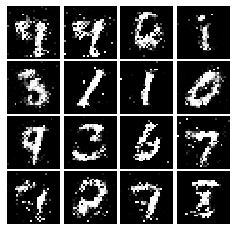

Epoch: 8, Iter: 4180, D: 0.2385, G:0.1749


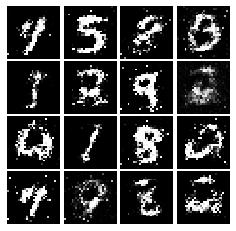

Epoch: 8, Iter: 4200, D: 0.212, G:0.1799


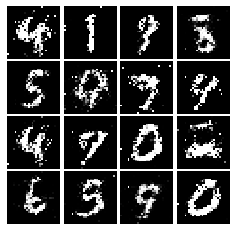

Epoch: 8, Iter: 4220, D: 0.2166, G:0.1852


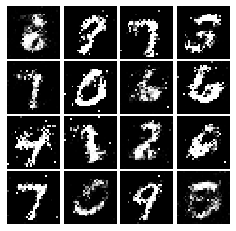

Epoch: 9, Iter: 4240, D: 0.2399, G:0.1595


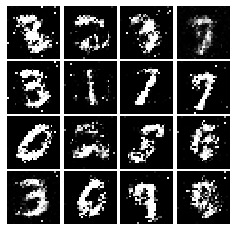

Epoch: 9, Iter: 4260, D: 0.2454, G:0.1897


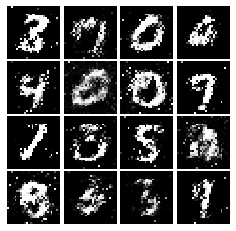

Epoch: 9, Iter: 4280, D: 0.2257, G:0.1592


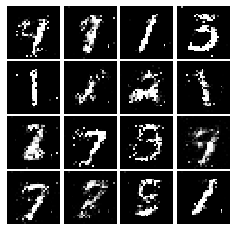

Epoch: 9, Iter: 4300, D: 0.2224, G:0.1933


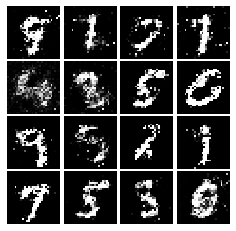

Epoch: 9, Iter: 4320, D: 0.2146, G:0.1508


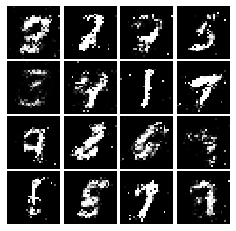

Epoch: 9, Iter: 4340, D: 0.235, G:0.158


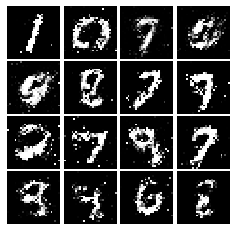

Epoch: 9, Iter: 4360, D: 0.2348, G:0.186


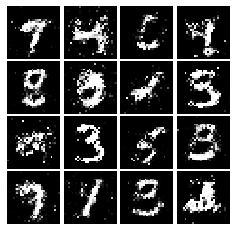

Epoch: 9, Iter: 4380, D: 0.2368, G:0.1735


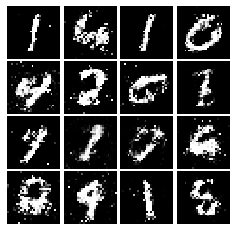

Epoch: 9, Iter: 4400, D: 0.1962, G:0.1798


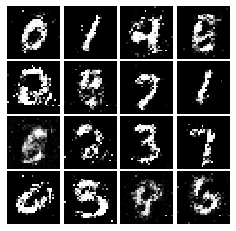

Epoch: 9, Iter: 4420, D: 0.2446, G:0.1879


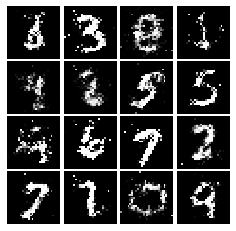

Epoch: 9, Iter: 4440, D: 0.2427, G:0.1758


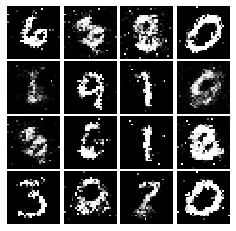

Epoch: 9, Iter: 4460, D: 0.2387, G:0.1607


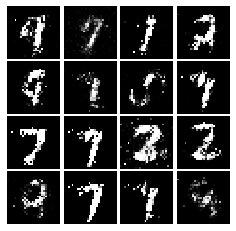

Epoch: 9, Iter: 4480, D: 0.2206, G:0.187


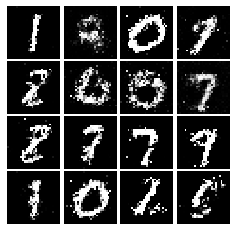

Epoch: 9, Iter: 4500, D: 0.2302, G:0.1724


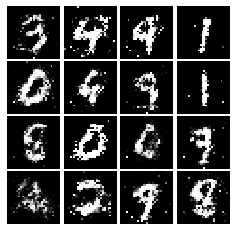

Epoch: 9, Iter: 4520, D: 0.2308, G:0.1556


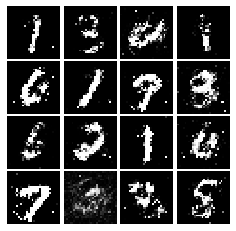

Epoch: 9, Iter: 4540, D: 0.2478, G:0.1822


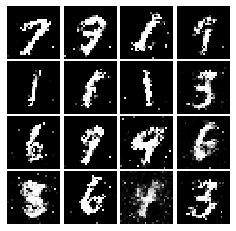

Epoch: 9, Iter: 4560, D: 0.2297, G:0.1663


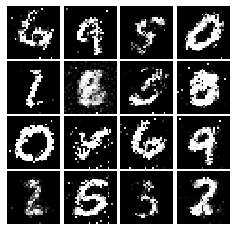

Epoch: 9, Iter: 4580, D: 0.2179, G:0.1321


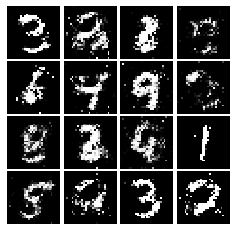

Epoch: 9, Iter: 4600, D: 0.2309, G:0.1829


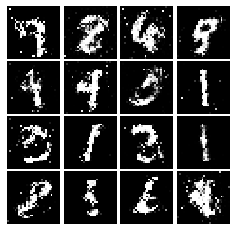

Epoch: 9, Iter: 4620, D: 0.2257, G:0.1659


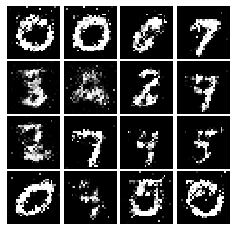

Epoch: 9, Iter: 4640, D: 0.2413, G:0.1649


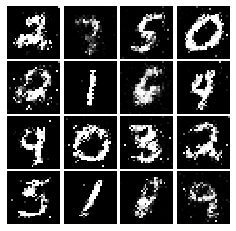

Epoch: 9, Iter: 4660, D: 0.2288, G:0.1694


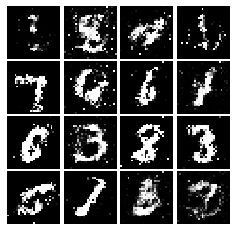

Epoch: 9, Iter: 4680, D: 0.2172, G:0.1521


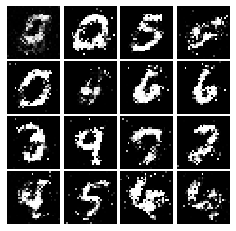

Final images


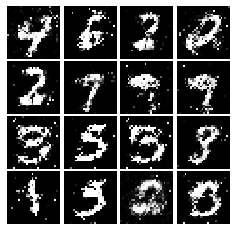

In [27]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [30]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [31]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.356, G:0.6582


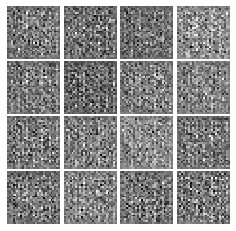

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3296, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-32-f5be52ba0a9c>", line 11, in <module>
    run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)
  File "<ipython-input-21-ed1561b7e235>", line 31, in run_a_gan
    D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py", line 549, in apply_gradients
    "name": name,
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/tensorflow/python/distribute/distribute_lib.py", line 2715, in merge_call
    return self._merge_call(merge_fn, args, kwargs)
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-pac

KeyboardInterrupt: 

In [32]:
############################### I have no GPU TAT
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
